In [1]:
import pandas as pd
import numpy as np
import re
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns

#Importing nltk packages
import nltk
import string
from nltk.tokenize import word_tokenize
from string import punctuation,digits
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

#seting options for data set 
#pd.set_option('display.max_columns', 100)  # or 1000
#pd.set_option('display.max_rows', 100)  # or 1000
#pd.set_option('display.max_colwidth', 80)  # or 199

In [2]:
#Loading Data Set
orgData=pd.read_csv(r'E:\Education\DataScience\Final_Project\mbti_1.csv')
data=orgData.copy()

In [3]:
#first five rows of dataset
data.head()

,type,posts
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...
1,ENTP,'I'm finding the lack of me in these posts ver...
2,INTP,'Good one _____ https://www.youtube.com/wat...
3,INTJ,"'Dear INTP, I enjoyed our conversation the o..."
4,ENTJ,'You're fired.|||That's another silly misconce...


In [4]:
data.shape

(8675, 2)

There are 8675 rows and 2 columns in the dataframe

In [5]:
#viewing the data information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8675 entries, 0 to 8674
Data columns (total 2 columns):
type     8675 non-null object
posts    8675 non-null object
dtypes: object(2)
memory usage: 135.6+ KB


The dataset has two columns 'type' and 'posts' which are 'object' datatype and it has no null values.

In [6]:
#Examining the number of unique items in the 'type' column 
data['type'].unique()

array(['INFJ', 'ENTP', 'INTP', 'INTJ', 'ENTJ', 'ENFJ', 'INFP', 'ENFP',
       'ISFP', 'ISTP', 'ISFJ', 'ISTJ', 'ESTP', 'ESFP', 'ESTJ', 'ESFJ'],
      dtype=object)

The 'type' column contains 16 unique codes, representing the 16 different personality types.

In [7]:
data.posts[0]

"'http://www.youtube.com/watch?v=qsXHcwe3krw|||http://41.media.tumblr.com/tumblr_lfouy03PMA1qa1rooo1_500.jpg|||enfp and intj moments  https://www.youtube.com/watch?v=iz7lE1g4XM4  sportscenter not top ten plays  https://www.youtube.com/watch?v=uCdfze1etec  pranks|||What has been the most life-changing experience in your life?|||http://www.youtube.com/watch?v=vXZeYwwRDw8   http://www.youtube.com/watch?v=u8ejam5DP3E  On repeat for most of today.|||May the PerC Experience immerse you.|||The last thing my INFJ friend posted on his facebook before committing suicide the next day. Rest in peace~   http://vimeo.com/22842206|||Hello ENFJ7. Sorry to hear of your distress. It's only natural for a relationship to not be perfection all the time in every moment of existence. Try to figure the hard times as times of growth, as...|||84389  84390  http://wallpaperpassion.com/upload/23700/friendship-boy-and-girl-wallpaper.jpg  http://assets.dornob.com/wp-content/uploads/2010/04/round-home-design.jpg ...

In [8]:
types=[i.lower() for i in list(data['type'].unique())]
print(types)

['infj', 'entp', 'intp', 'intj', 'entj', 'enfj', 'infp', 'enfp', 'isfp', 'istp', 'isfj', 'istj', 'estp', 'esfp', 'estj', 'esfj']


Converting type coulmns to lower case

In [9]:
stop=stopwords.words("english") #list of stop words 
print(stop)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [10]:
stop_update=stop+['people','type','think','thing','know','really','one','could','would']

# Data Wrangling

## Replacing pipelines

In [11]:
data['posts']=data['posts'].map(lambda x: x.lower().replace('|||',' ')) #replacing 3 pipelines('|||') with a space

In [12]:
data.posts[0]

"'http://www.youtube.com/watch?v=qsxhcwe3krw http://41.media.tumblr.com/tumblr_lfouy03pma1qa1rooo1_500.jpg enfp and intj moments  https://www.youtube.com/watch?v=iz7le1g4xm4  sportscenter not top ten plays  https://www.youtube.com/watch?v=ucdfze1etec  pranks what has been the most life-changing experience in your life? http://www.youtube.com/watch?v=vxzeywwrdw8   http://www.youtube.com/watch?v=u8ejam5dp3e  on repeat for most of today. may the perc experience immerse you. the last thing my infj friend posted on his facebook before committing suicide the next day. rest in peace~   http://vimeo.com/22842206 hello enfj7. sorry to hear of your distress. it's only natural for a relationship to not be perfection all the time in every moment of existence. try to figure the hard times as times of growth, as... 84389  84390  http://wallpaperpassion.com/upload/23700/friendship-boy-and-girl-wallpaper.jpg  http://assets.dornob.com/wp-content/uploads/2010/04/round-home-design.jpg ... welcome and stu

## Removing the URLS

In [13]:
data['posts']=data['posts'].map(lambda x: re.sub(r'http\S+',' ',x))

In [14]:
data.posts[0]

"'    enfp and intj moments     sportscenter not top ten plays     pranks what has been the most life-changing experience in your life?        on repeat for most of today. may the perc experience immerse you. the last thing my infj friend posted on his facebook before committing suicide the next day. rest in peace~     hello enfj7. sorry to hear of your distress. it's only natural for a relationship to not be perfection all the time in every moment of existence. try to figure the hard times as times of growth, as... 84389  84390       ... welcome and stuff.    game. set. match. prozac, wellbrutin, at least thirty minutes of moving your legs (and i don't mean moving them while sitting in your same desk chair), weed in moderation (maybe try edibles as a healthier alternative... basically come up with three items you've determined that each type (or whichever types you want to do) would more than likely use, given each types' cognitive functions and whatnot, when left by... all things in 

## Expanding all Contractions

In [15]:
import re

def decontracted(phrase):
     # specific
    phrase = re.sub(r"won\'t", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)
    phrase = re.sub(r"can\'t\'ve", "cannot have",phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)    
    return phrase

In [16]:
data['posts']=data['posts'].map(lambda x: decontracted(x))

In [17]:
data['posts'][1]

"'i am finding the lack of me in these posts very alarming. sex can be boring if it is in the same position often. for example me and my girlfriend are currently in an environment where we have to creatively use cowgirl and missionary. there is not enough... giving new meaning to 'game' theory. hello *entp grin*  that is all it takes. than we converse and they do most of the flirting while i acknowledge their presence and return their words with smooth wordplay and more cheeky grins. this + lack of balance and hand eye coordination. real iq test i score 127. internet iq tests are funny. i score 140s or higher.  now, like the former responses of this thread i will mention that i do not believe in the iq test. before you banish... you know you are an entp when you vanish from a site for a year and a half, return, and find people are still commenting on your posts and liking your ideas/thoughts. you know you are an entp when you...     i over think things sometimes. i go by the old sherlo

In [18]:
combined_post=' '.join(data.posts)

In [19]:
len(combined_post) 

60925284

In [20]:
word_token=word_tokenize(combined_post.lower())

In [21]:
print(len(word_token))

13136894


## Calculating Frequency distribution

In [22]:
from nltk.probability import FreqDist

In [23]:
fdist=FreqDist(word_token)
fdist 

FreqDist({'i': 632280, '.': 555570, ',': 464086, 'the': 308412, 'to': 304741, '...': 286913, 'is': 251070, 'a': 245866, 'and': 242881, 'you': 186976, ...})

**It will give us in descending ordered frequencies**

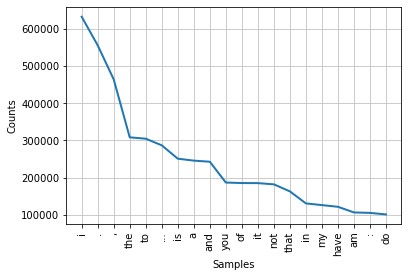

In [24]:
fdist.plot(20,cumulative=False)
plt.show()

- **we are taking the top 20 words**
- **The least and most used words are of no meaning so we can just knock off first n or last n. so we will have to create.**
- **a list of stop words that need to be removed**

## Top 10 words before cleaning

In [25]:
pd.Series(combined_post.split()).value_counts().sort_values(ascending=False).head(10)

i      613958
the    298682
to     294184
a      238633
is     238476
and    232541
of     179577
not    170277
you    169237
it     156708
dtype: int64

## Removing all the MBTI types used in posts

In [26]:
for i in types:
    data['posts']=data['posts'].map(lambda x:re.sub(i+'[a-z]*','',x))

In [27]:
data.posts[1]

"'i am finding the lack of me in these posts very alarming. sex can be boring if it is in the same position often. for example me and my girlfriend are currently in an environment where we have to creatively use cowgirl and missionary. there is not enough... giving new meaning to 'game' theory. hello * grin*  that is all it takes. than we converse and they do most of the flirting while i acknowledge their presence and return their words with smooth wordplay and more cheeky grins. this + lack of balance and hand eye coordination. real iq test i score 127. internet iq tests are funny. i score 140s or higher.  now, like the former responses of this thread i will mention that i do not believe in the iq test. before you banish... you know you are an  when you vanish from a site for a year and a half, return, and find people are still commenting on your posts and liking your ideas/thoughts. you know you are an  when you...     i over think things sometimes. i go by the old sherlock holmes qu

## Confirmation

In [28]:
flag=0
for i in data['posts']:
    for x in types:
        if i.find(x)==-1:
            flag=0
        else:
            flag=1
if flag==0:
    print("MBTI types are cleaned inside the text")
else:
    print("MBTI types are yet to be cleaned")

MBTI types are cleaned inside the text


## Removing all punctuations present in posts

In [29]:
data['posts']=data['posts'].map(lambda x : x.translate(str.maketrans('', '', string.punctuation)))

In [30]:
data['posts'][1]

'i am finding the lack of me in these posts very alarming sex can be boring if it is in the same position often for example me and my girlfriend are currently in an environment where we have to creatively use cowgirl and missionary there is not enough giving new meaning to game theory hello  grin  that is all it takes than we converse and they do most of the flirting while i acknowledge their presence and return their words with smooth wordplay and more cheeky grins this  lack of balance and hand eye coordination real iq test i score 127 internet iq tests are funny i score 140s or higher  now like the former responses of this thread i will mention that i do not believe in the iq test before you banish you know you are an  when you vanish from a site for a year and a half return and find people are still commenting on your posts and liking your ideasthoughts you know you are an  when you     i over think things sometimes i go by the old sherlock holmes quote  perhaps when a man has spec

## Removing all the digits in the posts

In [31]:
data['posts']=data['posts'].map(lambda x : x.translate(str.maketrans('', '', string.digits)))

In [32]:
data['posts'][1]

'i am finding the lack of me in these posts very alarming sex can be boring if it is in the same position often for example me and my girlfriend are currently in an environment where we have to creatively use cowgirl and missionary there is not enough giving new meaning to game theory hello  grin  that is all it takes than we converse and they do most of the flirting while i acknowledge their presence and return their words with smooth wordplay and more cheeky grins this  lack of balance and hand eye coordination real iq test i score  internet iq tests are funny i score s or higher  now like the former responses of this thread i will mention that i do not believe in the iq test before you banish you know you are an  when you vanish from a site for a year and a half return and find people are still commenting on your posts and liking your ideasthoughts you know you are an  when you     i over think things sometimes i go by the old sherlock holmes quote  perhaps when a man has special kn

## Checking the tokenizing for one of the posts

In [33]:
word_tok=word_tokenize(data['posts'][1])
print(word_tok)

['i', 'am', 'finding', 'the', 'lack', 'of', 'me', 'in', 'these', 'posts', 'very', 'alarming', 'sex', 'can', 'be', 'boring', 'if', 'it', 'is', 'in', 'the', 'same', 'position', 'often', 'for', 'example', 'me', 'and', 'my', 'girlfriend', 'are', 'currently', 'in', 'an', 'environment', 'where', 'we', 'have', 'to', 'creatively', 'use', 'cowgirl', 'and', 'missionary', 'there', 'is', 'not', 'enough', 'giving', 'new', 'meaning', 'to', 'game', 'theory', 'hello', 'grin', 'that', 'is', 'all', 'it', 'takes', 'than', 'we', 'converse', 'and', 'they', 'do', 'most', 'of', 'the', 'flirting', 'while', 'i', 'acknowledge', 'their', 'presence', 'and', 'return', 'their', 'words', 'with', 'smooth', 'wordplay', 'and', 'more', 'cheeky', 'grins', 'this', 'lack', 'of', 'balance', 'and', 'hand', 'eye', 'coordination', 'real', 'iq', 'test', 'i', 'score', 'internet', 'iq', 'tests', 'are', 'funny', 'i', 'score', 's', 'or', 'higher', 'now', 'like', 'the', 'former', 'responses', 'of', 'this', 'thread', 'i', 'will', 'me

## Tokenizing all the posts

In [34]:
data['posts']=data['posts'].map(lambda x: " ".join(word_tokenize(x)))

In [35]:
data['posts'][1]

'i am finding the lack of me in these posts very alarming sex can be boring if it is in the same position often for example me and my girlfriend are currently in an environment where we have to creatively use cowgirl and missionary there is not enough giving new meaning to game theory hello grin that is all it takes than we converse and they do most of the flirting while i acknowledge their presence and return their words with smooth wordplay and more cheeky grins this lack of balance and hand eye coordination real iq test i score internet iq tests are funny i score s or higher now like the former responses of this thread i will mention that i do not believe in the iq test before you banish you know you are an when you vanish from a site for a year and a half return and find people are still commenting on your posts and liking your ideasthoughts you know you are an when you i over think things sometimes i go by the old sherlock holmes quote perhaps when a man has special knowledge and 

## Removing all the stop words

In [36]:
#text=data['posts'][1]
#n_text=[term for term in text.split() if term not in stop]
#print(n_text)
data['posts'] = data['posts'].apply(lambda x: ' '.join([word for word in x.split() if word not in stop]))

In [37]:
data.posts[0]

'moments sportscenter top ten plays pranks lifechanging experience life repeat today may perc experience immerse last thing friend posted facebook committing suicide next day rest peace hello sorry hear distress natural relationship perfection time every moment existence try figure hard times times growth welcome stuff game set match prozac wellbrutin least thirty minutes moving legs mean moving sitting desk chair weed moderation maybe try edibles healthier alternative basically come three items determined type whichever types want would likely use given types cognitive functions whatnot left things moderation sims indeed video game good one note good one somewhat subjective completely promoting death given sim dear favorite video games growing current favorite video games cool appears late sad someone everyone wait thought confidence good thing cherish time solitude bc revel within inner world whereas time would workin enjoy time worry people always around yo ladies complimentary pers

## Lemmatizing the words

In [38]:
lemm=WordNetLemmatizer()
#final_text=[lemm.lemmatize(word) for word in n_text]
#print(final_text)
data['posts']=data['posts'].apply(lambda x: lemm.lemmatize(x))

In [39]:
data.head()

,type,posts
0,INFJ,moments sportscenter top ten plays pranks life...
1,ENTP,finding lack posts alarming sex boring positio...
2,INTP,good one course say know blessing curse absolu...
3,INTJ,wouldear enjoyed conversation day esoteric gab...
4,ENTJ,fired another silly misconception approaching ...


# Data Preprocessing

### Creating a user_def_function 

In [59]:
#Cleaning all the data
def clean_text(post):
    
    lemm=WordNetLemmatizer() #Defining lemmitizer Object
    
    stop=stopwords.words("english")+['people','type','think','thing','know','really','one','could','would'] #getting all the stop_words
    
    types=list(data['type'].unique()) #getting all the personality types
    
    types=[i.lower() for i in types] #converting to lower case
    
    
    text=post.lower().replace('|||',' ') #replacing 3 pipelines('|||') with a space
    
    text=re.sub(r'http\S+',' ', text) #Removing Website links
    
    text=decontracted(text) #expanding the contractions
    
    #for i in types:                          # Removing the MBTI types in the text
        #text=re.sub(i+'[a-z]*','',text)
    
    text= text.translate(str.maketrans('', '', string.punctuation)) #removing punctuations
    
    text= text.translate(str.maketrans('', '', string.digits)) #removing digits
    
    text=word_tokenize(text)
    
    text=" ".join(text)
    
    text=[term for term in text.split() if term not in stop] #removing all stop wrods
    
    final_text=[lemm.lemmatize(word) for word in text] #applying lemmatization technique
    
    return ' '.join(final_text)

In [60]:
orgData['clean_text']=orgData.posts.apply(clean_text)

In [61]:
orgData['clean_text_no_type_ref']=data['posts'] #adding no mbti type reference to the original data set

In [62]:
orgData.head()

,type,posts,clean_text,clean_text_no_type_ref,I/E,N/S,F/T,P/J,words_per_comment_unclean,words_per_comment_clean
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,enfp intj moment sportscenter top ten play pra...,moments sportscenter top ten plays pranks life...,1,1,1,0,556,293
1,ENTP,'I'm finding the lack of me in these posts ver...,finding lack post alarming sex boring position...,finding lack posts alarming sex boring positio...,0,1,0,1,1170,526
2,INTP,'Good one _____ https://www.youtube.com/wat...,good course say blessing curse absolutely posi...,good one course say know blessing curse absolu...,1,1,0,1,836,400
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",wouldear intp enjoyed conversation day esoteri...,wouldear enjoyed conversation day esoteric gab...,1,1,0,0,1064,489
4,ENTJ,'You're fired.|||That's another silly misconce...,fired another silly misconception approaching ...,fired another silly misconception approaching ...,0,1,0,0,967,442


In [44]:
print(len(orgData['posts'][1]),',',len(orgData['clean_text'][1]))

7053 , 3395


In [45]:
orgData['clean_text'][0]

'enfp intj moment sportscenter top ten play prank lifechanging experience life repeat today may perc experience immerse last infj friend posted facebook committing suicide next day rest peace hello enfj sorry hear distress natural relationship perfection time every moment existence try figure hard time time growth welcome stuff game set match prozac wellbrutin least thirty minute moving leg mean moving sitting desk chair weed moderation maybe try edible healthier alternative basically come three item determined whichever type want likely use given type cognitive function whatnot left thing moderation sims indeed video game good note good somewhat subjective completely promoting death given sim dear enfp favorite video game growing current favorite video game cool appears late sad someone everyone wait thought confidence good cherish time solitude bc revel within inner world whereas time workin enjoy time worry always around yo entp lady complimentary personalitywell hey main social out

In [63]:
clean_post=' '.join(orgData.clean_text)

In [64]:
print(len(clean_post))

33223066


## Top 10 words after cleaning

In [65]:
pd.Series(clean_post.split()).value_counts().sort_values(ascending=False).head(10)

like      70377
get       33251
time      33101
feel      25602
make      23482
much      23006
say       22551
well      22120
friend    21781
way       21620
dtype: int64

# Data Visualization

(array([   0.,  250.,  500.,  750., 1000., 1250., 1500., 1750., 2000.]),
 <a list of 9 Text major ticklabel objects>)

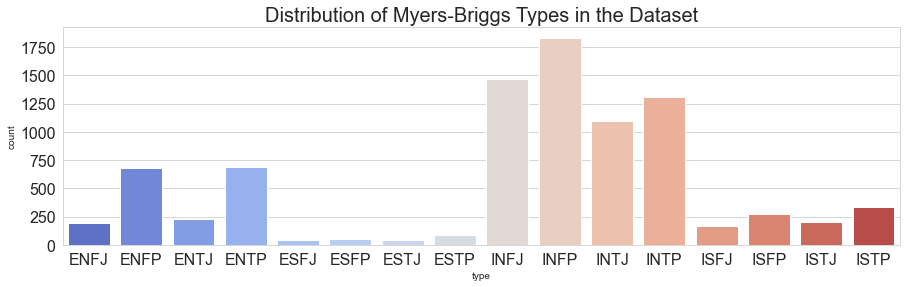

In [66]:
#countplot of the 16 personality types in the dataset
dims=(15.0,4.0)
fig, ax = plt.subplots(figsize=dims)
coolwarm = sns.color_palette("coolwarm", 16)
sns.set_palette(coolwarm)
sns.set_style("whitegrid")
sns.countplot(x="type", data=orgData,\
              order=["ENFJ","ENFP","ENTJ","ENTP","ESFJ","ESFP","ESTJ","ESTP",\
                     "INFJ","INFP","INTJ","INTP","ISFJ","ISFP","ISTJ","ISTP"])
plt.title("Distribution of Myers-Briggs Types in the Dataset", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

In [67]:
type_count=pd.DataFrame(orgData['type'].value_counts())
type_count.reset_index(inplace=True)
type_count.columns=['Type','Count']
type_count

,Type,Count
0,INFP,1832
1,INFJ,1470
2,INTP,1304
3,INTJ,1091
4,ENTP,685
5,ENFP,675
6,ISTP,337
7,ISFP,271
8,ENTJ,231
9,ISTJ,205


In [68]:
# Create a binary column for each of the 4 axis types for later analysis
orgData['I/E']=orgData['type'].map(lambda x: 1 if x[0]=='I' else 0)
orgData['N/S']=orgData['type'].map(lambda x: 1 if x[1]=='N' else 0)
orgData['F/T']=orgData['type'].map(lambda x: 1 if x[2]=='F' else 0)
orgData['P/J']=orgData['type'].map(lambda x: 1 if x[3]=='P' else 0)

In [69]:
orgData.head()

,type,posts,clean_text,clean_text_no_type_ref,I/E,N/S,F/T,P/J,words_per_comment_unclean,words_per_comment_clean
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,enfp intj moment sportscenter top ten play pra...,moments sportscenter top ten plays pranks life...,1,1,1,0,556,293
1,ENTP,'I'm finding the lack of me in these posts ver...,finding lack post alarming sex boring position...,finding lack posts alarming sex boring positio...,0,1,0,1,1170,526
2,INTP,'Good one _____ https://www.youtube.com/wat...,good course say blessing curse absolutely posi...,good one course say know blessing curse absolu...,1,1,0,1,836,400
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",wouldear intp enjoyed conversation day esoteri...,wouldear enjoyed conversation day esoteric gab...,1,1,0,0,1064,489
4,ENTJ,'You're fired.|||That's another silly misconce...,fired another silly misconception approaching ...,fired another silly misconception approaching ...,0,1,0,0,967,442


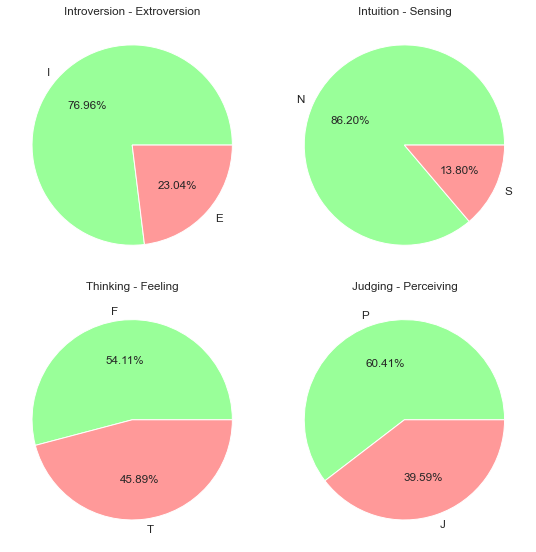

In [70]:
fig = plt.figure(figsize=(8,8),dpi=70)
#2 rows 2 cols
#first row, first col
ax1 = plt.subplot2grid((2,2),(0,0))
plt.pie(orgData['I/E'].value_counts(), labels=['I','E'],colors=['#99ff99','#ff9999'],autopct='%.2f%%',textprops={'fontsize': 12})
plt.title('Introversion - Extroversion')

#first row sec col
ax1 = plt.subplot2grid((2,2), (0, 1))
plt.pie(orgData['N/S'].value_counts(), labels=['N','S'],colors=['#99ff99','#ff9999'],autopct='%.2f%%',textprops={'fontsize': 12})
plt.title('Intuition - Sensing')

#Second row first column
ax1 = plt.subplot2grid((2,2), (1, 0))
plt.pie(orgData['F/T'].value_counts(), labels=['F','T'],colors=['#99ff99','#ff9999'],autopct='%.2f%%',textprops={'fontsize': 12})
plt.title('Thinking - Feeling')

#second row second column
ax1 = plt.subplot2grid((2,2), (1, 1))
plt.pie(orgData['P/J'].value_counts(), labels=['P','J'],colors=['#99ff99','#ff9999'],autopct='%.2f%%',textprops={'fontsize': 12})
plt.title('Judging - Perceiving')
#fig.tight_layout(pad=1.0) #if you want to adjust the space between subplots
fig.tight_layout()

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5]),
 <a list of 6 Text major ticklabel objects>)

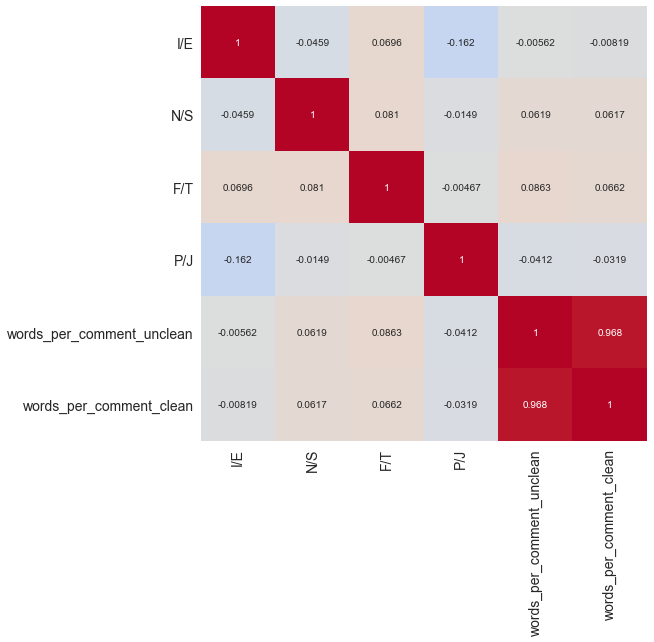

In [71]:
plt.figure(figsize=[8,8])
sns.heatmap(orgData.corr(),annot=True,fmt ='.3g',center=0,cmap='coolwarm',cbar=False)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

In [72]:
orgData.shape

(8675, 10)

# Mean Word Count

In [73]:
#using lambda functions, create new columns with counts of cleand and uncleaned entries 
orgData['words_per_comment_unclean'] = orgData['posts'].apply(lambda x: len(x.split()))
orgData['words_per_comment_clean'] = orgData['clean_text'].apply(lambda x: len(x.split()))

In [74]:
orgData.head()

,type,posts,clean_text,clean_text_no_type_ref,I/E,N/S,F/T,P/J,words_per_comment_unclean,words_per_comment_clean
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,enfp intj moment sportscenter top ten play pra...,moments sportscenter top ten plays pranks life...,1,1,1,0,556,293
1,ENTP,'I'm finding the lack of me in these posts ver...,finding lack post alarming sex boring position...,finding lack posts alarming sex boring positio...,0,1,0,1,1170,526
2,INTP,'Good one _____ https://www.youtube.com/wat...,good course say blessing curse absolutely posi...,good one course say know blessing curse absolu...,1,1,0,1,836,400
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",wouldear intp enjoyed conversation day esoteri...,wouldear enjoyed conversation day esoteric gab...,1,1,0,0,1064,489
4,ENTJ,'You're fired.|||That's another silly misconce...,fired another silly misconception approaching ...,fired another silly misconception approaching ...,0,1,0,0,967,442


<Figure size 720x360 with 0 Axes>

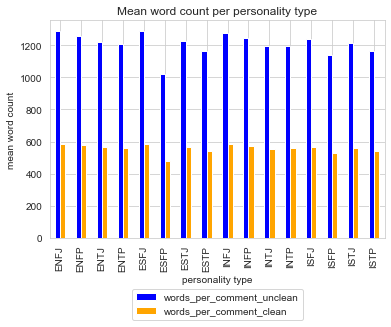

In [75]:
plt.figure(figsize=[10,5])
#graph mean word count per personality type
orgData[['type','words_per_comment_unclean','words_per_comment_clean']].groupby(['type']).mean().plot(kind='bar', legend=True,color=['blue','orange'])
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.4))
plt.title('Mean word count per personality type')
plt.xlabel('personality type')
plt.ylabel('mean word count')
plt.show()

While there is a difference between each category, it seems to be quite marginal. With 16 categories it is hard to tell. Conisdering how the MBTI tests are classified, it may be prudent to investigate the data from a different point of view to get a better picture of whats going on.

# Investigating by axis
Each of the four letters in each category classification is part of a bipolar axis. For instance the first letter of each classification is either E (extroversion) or I(introversion). This represents the first axis, where a person is rated along the axis between E and I. They recieve the first letter of their personalit classification based on whether they fell closer to E or I. There are 4 such axis, the second being N (intuition) to S (sensing), the third being T (thinking) to F (feeling) and the fourth being J (judging) to P (perceieving). Their final classification is a sequence of 4 letters, one selected from each axis. Based on this breakdown of how the personality is scored, I think we should investigate by axis to cut down on the categories to compare from 16 categories to 4 axis with two ends each.

In [76]:
#define the side of each axis by selecting entries with the corresponding letter in the correct position
extrovert = orgData.loc[orgData['type'].str[0] == 'E']
introvert = orgData.loc[orgData['type'].str[0] == 'I']
intuition = orgData.loc[orgData['type'].str[1] == 'N']
sensing = orgData.loc[orgData['type'].str[1] == 'S']
thinking = orgData.loc[orgData['type'].str[2] == 'T']
feeling = orgData.loc[orgData['type'].str[2] == 'F']
judging = orgData.loc[orgData['type'].str[3] == 'J']
perceiving = orgData.loc[orgData['type'].str[3] == 'P']

In [77]:
#list of tuples for reference (name, dataframe)
axes = (('Extrovert', extrovert), ('Introvert', introvert), ('Intuition', intuition), ('Sensing', sensing),
        ('Thinking', thinking), 
        ('Feeling',feeling), ('Judging',judging), ('Perceiving', perceiving))

#print the entry count and mean word count of each dataframe
for x, y in axes:
    print(x + ' total entries: ' + str(len(y)))
    print(x + ' posts mean word count ' + str(y['words_per_comment_clean'].mean()))
    print('\n')

Extrovert total entries: 1999
Extrovert posts mean word count 567.7083541770885


Introvert total entries: 6676
Introvert posts mean word count 565.1545835829838


Intuition total entries: 7478
Intuition posts mean word count 568.9860925381118


Sensing total entries: 1197
Sensing posts mean word count 545.4828738512949


Thinking total entries: 3981
Thinking posts mean word count 556.2999246420497


Feeling total entries: 4694
Feeling posts mean word count 573.7518108223263


Judging total entries: 3434
Judging posts mean word count 570.9123471170647


Perceiving total entries: 5241
Perceiving posts mean word count 562.3560389238695




There isn't too much difference within each axis in mean word count.

- The greatest difference is between intuition and sensing, with a range of 25, but sensing had the lowest entry count out of all the axis categories.
- The most notable difference in mean word count was between thinking and feeling (549 and 565 respectively), where their entry counts were only different by about 713.

This leads me to believe that mean word count is more than likely uniform across each of the 4 continuous axis and not distinct from either end in any of the categories.

# Top 10 words in all individual types

In [78]:
for x, y in axes:
    #print(x + ' total entries: ' + str(len(y)))
    #print(x + ' posts mean word count ' + str(y['words_per_comment_clean'].mean()))
    x_clean_post=' '.join(y.clean_text)
    print(x)
    print('==================')
    print(pd.Series(x_clean_post.split()).value_counts().sort_values(ascending=False).head(10))
    print('\n')

Extrovert
like      16650
get        8216
time       7264
friend     5604
make       5572
well       5469
love       5426
feel       5409
say        5308
much       5270
dtype: int64


Introvert
like    53727
time    25837
get     25035
feel    20193
make    17910
much    17736
say     17243
well    16651
way     16624
want    16306
dtype: int64


Intuition
like    60596
time    28538
get     28280
feel    22571
make    20414
much    19937
say     19431
well    19048
love    18884
way     18843
dtype: int64


Sensing
like      9781
get       4971
time      4563
say       3120
well      3072
much      3069
make      3068
friend    3060
feel      3031
want      2898
dtype: int64


Thinking
like    30027
get     15005
time    14391
make    10627
say     10212
well     9988
much     9646
way      9504
want     9148
good     8979
dtype: int64


Feeling
like      40350
time      18710
get       18246
feel      17233
love      14495
much      13360
friend    13105
make      12855
say       12

# Extroversion Vs Introversion

I initally assumed there would be more extroverts posting comments online, as I figured that an extroverted personality would be more comfortable with sharing with thoughts with strangers. My asssumption was wrong, as there are nearly 3.5x the entries for introverts than for extroverts. Consider this passage from Wikipedia:

***"People who prefer extraversion draw energy from action: they tend to act, then reflect, then act further. If they are inactive, their motivation tends to decline. To rebuild their energy, extraverts need breaks from time spent in reflection. Conversely, those who prefer introversion "expend" energy through action: they prefer to reflect, then act, then reflect again. To rebuild their energy, introverts need quiet time alone, away from activity."***

If the internet a place for reflection and not action, then that would explain why introverts are more active online according to this dataset. Looking at the word cloud, there is some obvious overlap in word choice, but just as many differences. Something worth noting is that introverts will reference introverts when commenting, as opposed to extroverts who not only reference themselves but also introverts.

Extrovert total entries: 1999
Extrovert posts mean word count 567.7083541770885


Introvert total entries: 6676
Introvert posts mean word count 565.1545835829838




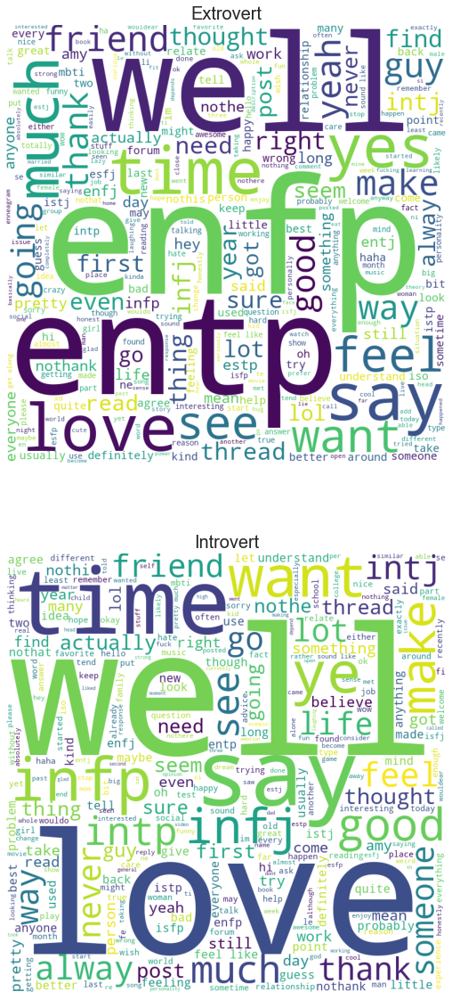

In [79]:
fig, ax = plt.subplots(2, sharex=True, figsize=(15,20))
k = 0
for x, y in axes[:2]:
    print(x + ' total entries: ' + str(len(y)))
    print(x + ' posts mean word count ' + str(y['words_per_comment_clean'].mean()))
    print('\n')
    wordcloud = WordCloud(width=800,height=800,background_color='white',max_words=300).generate(y['clean_text'].to_string())
    ax[k].imshow(wordcloud)
    ax[k].set_title(x, fontsize=20)
    ax[k].axis("off")
    k += 1

# Intuition Vs Sensing
This axis had the starkest difference in difference in representation in the dataset (7478 intuition versus 1197 sensing, a whopping 6.25x more intuition entries than sensing). Their difference in mean word count could definitely have been affected by this representation bias. To understand the implications of this representation bias, consider this passage from Wikipedia concerning the I vs S axis:

***"People who prefer sensing are more likely to trust information that is in the present, tangible, and concrete: that is, information that can be understood by the five senses... They prefer to look for details and facts. For them, the meaning is in the data. On the other hand, those who prefer intuition tend to trust information that is less dependent upon the senses, that can be associated with other information (either remembered or discovered by seeking a wider context or pattern)."***

Without philosophizing to much about the implications of the internet's affect on people's means of perceiving the world around them, I would consider this passage to be a decent explaination of the representation bias within this data set. The way that one interacts with and through the internet is fairly limited in sensory terms; we can read information, watch videos, and listen to audio. There is little to no physical aspect of the internet with which to interact. It makes sense to think then, that the internet would attract people who trust information as it exists in context with other information (from a technology primarily concerned with the disbursement of information). In other words, the internet is a provincial paradise for people on the intuition side of this axis, and a sensory void for those on the sensing end of the spectrum.

Intuition total entries: 7478
Intuition posts mean word count 568.9860925381118


Sensing total entries: 1197
Sensing posts mean word count 545.4828738512949




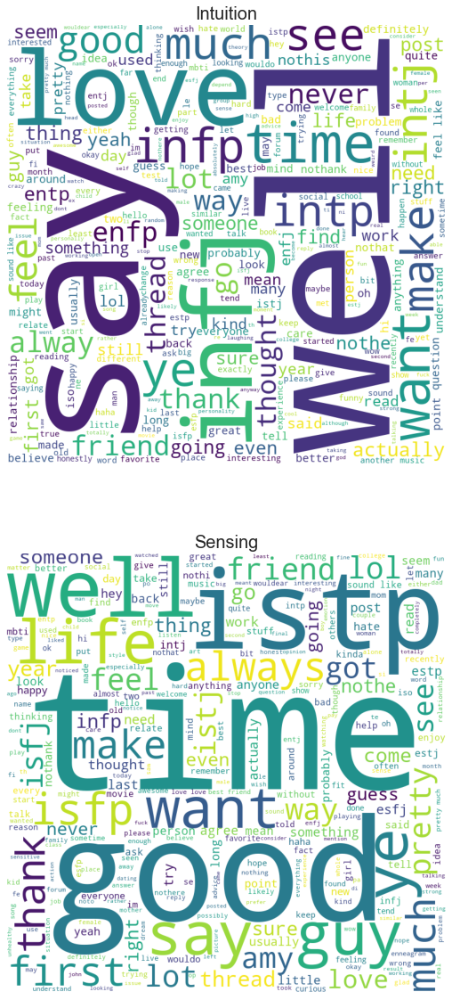

In [80]:
fig, ax = plt.subplots(2, sharex=True, figsize=(15,20))
k = 0
for x, y in axes[2:4]:
    print(x + ' total entries: ' + str(len(y)))
    print(x + ' posts mean word count ' + str(y['words_per_comment_clean'].mean()))
    print('\n')
    wordcloud = WordCloud(width=800,height=800,background_color='white',max_words=300).generate(y['clean_text'].to_string())
    ax[k].imshow(wordcloud)
    ax[k].set_title(x, fontsize=20)
    ax[k].axis("off")
    k += 1

# Thinking Vs Feeling
Here we see a more or less equal representation on both ends of the this particular axis. Perhaps there is no difference in the two that would govern different behavior online? Again, let's refer to what we already know from Wikipedia:

***"Those who prefer thinking tend to decide things from a more detached standpoint, measuring the decision by what seems reasonable, logical, causal, consistent, and matching a given set of rules. Those who prefer feeling tend to come to decisions by associating or empathizing with the situation, looking at it 'from the inside' and weighing the situation to achieve, on balance, the greatest harmony, consensus and fit, considering the needs of the people involved."***

So then it seams there isn't a difference between the two ends that would merit a contrast in their behavior online. However, this axis exhibits the biggest difference mean entry length (at least the difference that might not be due to bias in the data, which of course is an assumption on my behalf). Would it be too much of a stretch to say that those on the thinking end of the axis, being more governed by logic and order, would post shorter comments? Within the boundaries of what we can see, that is already pushing the limits of we can assume.

Thinking total entries: 3981
Thinking posts mean word count 556.2999246420497


Feeling total entries: 4694
Feeling posts mean word count 573.7518108223263




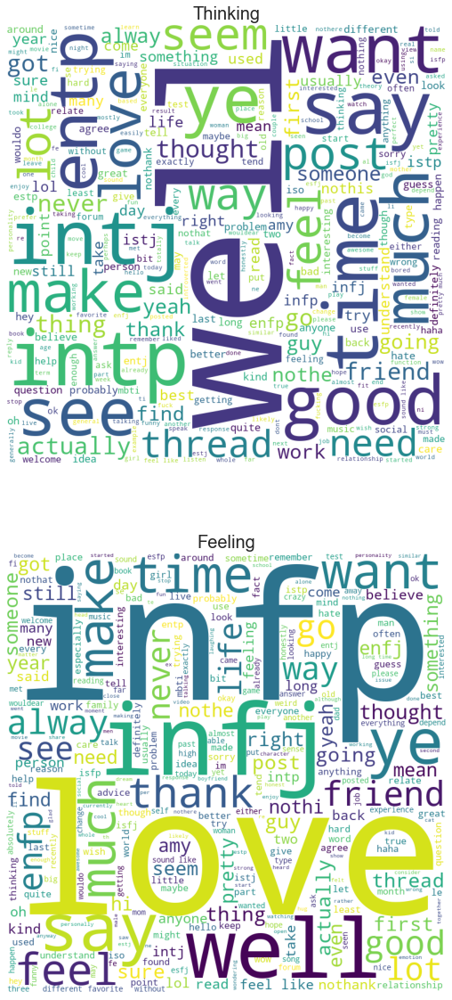

In [81]:
fig, ax = plt.subplots(2, sharex=True, figsize=(15,20))
k = 0
for x, y in axes[4:6]:
    print(x + ' total entries: ' + str(len(y)))
    print(x + ' posts mean word count ' + str(y['words_per_comment_clean'].mean()))
    print('\n')
    wordcloud = WordCloud(width=800,height=800,background_color='white',max_words=300).generate(y['clean_text'].to_string())
    ax[k].imshow(wordcloud)
    ax[k].set_title(x, fontsize=20)
    ax[k].axis("off")
    k += 1

# Judging Vs Percieving
Not a whole lot going on here, besides a disproportioned representation between judging and percieving. Is there an explanation for this (seemingly minor) distinction?

***"According to Myers, judging types like to "have matters settled"... perceptive types prefer to "keep decisions open"."***

Perhaps then we might say that perceptive types are more likely to be open to and respond to discussions on the internet, as opposed to Judging types who might have already have their minds made up and thus find interaction on the web to be less appealing.

Judging total entries: 3434
Judging posts mean word count 570.9123471170647


Perceiving total entries: 5241
Perceiving posts mean word count 562.3560389238695




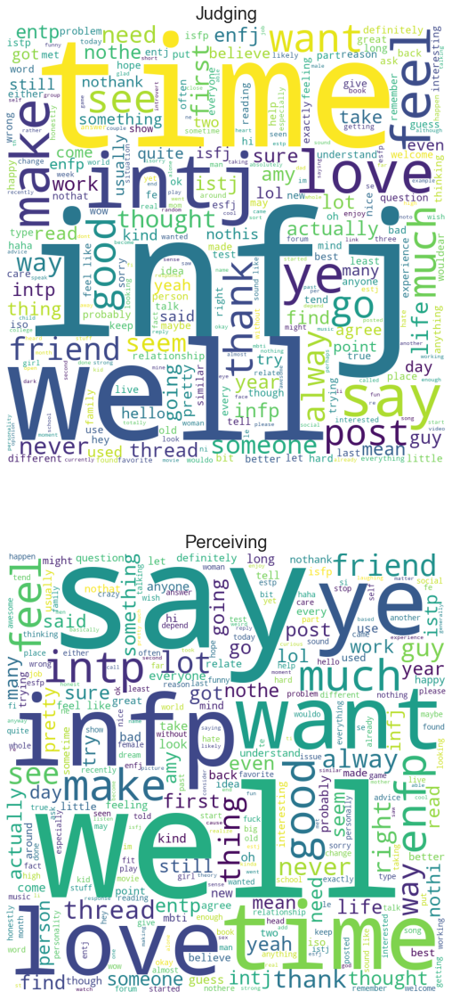

In [82]:
fig, ax = plt.subplots(2, sharex=True, figsize=(15,20))
k = 0
for x, y in axes[6:8]:
    print(x + ' total entries: ' + str(len(y)))
    print(x + ' posts mean word count ' + str(y['words_per_comment_clean'].mean()))
    print('\n')
    wordcloud = WordCloud(width=800,height=800,background_color='white',max_words=300).generate(y['clean_text'].to_string())
    ax[k].imshow(wordcloud)
    ax[k].set_title(x, fontsize=20)
    ax[k].axis("off")
    k += 1

# Word Cloud for all 16 MBTI Types

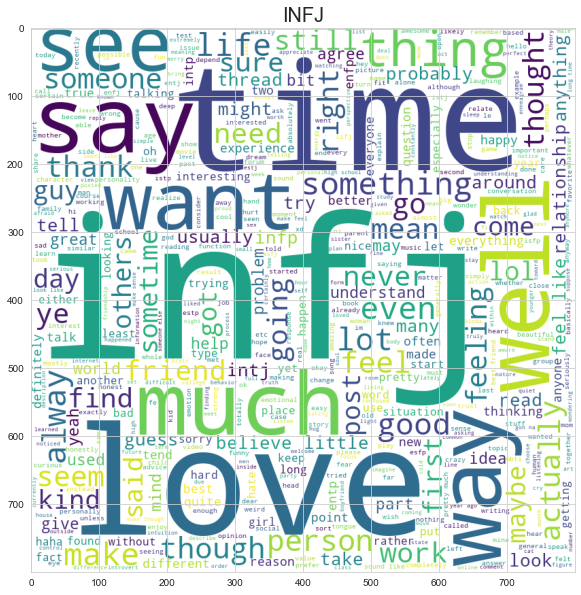

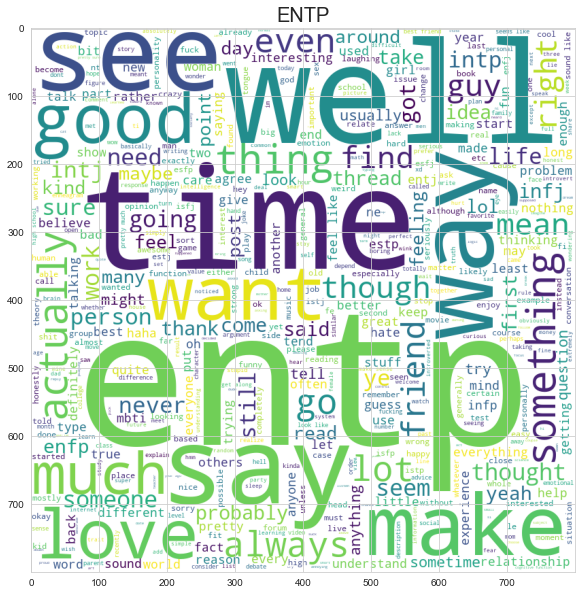

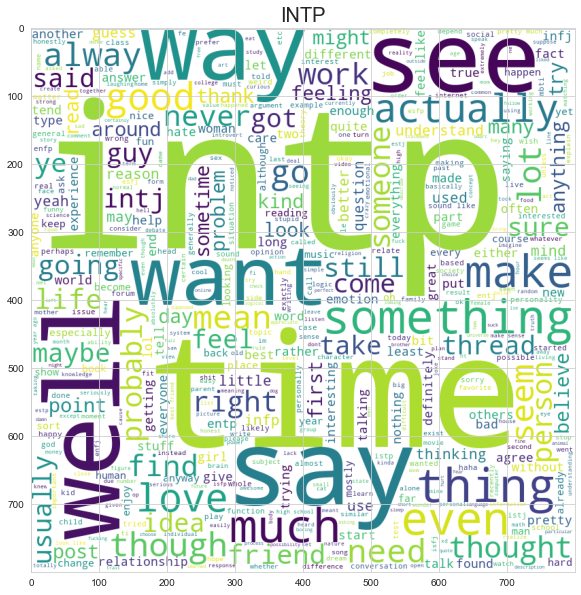

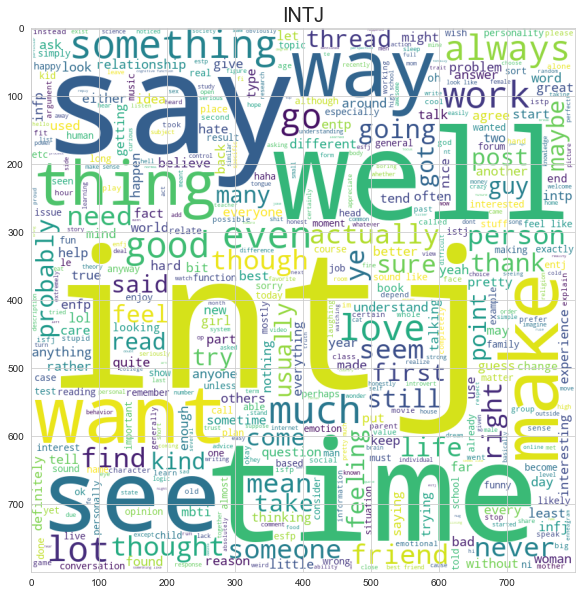

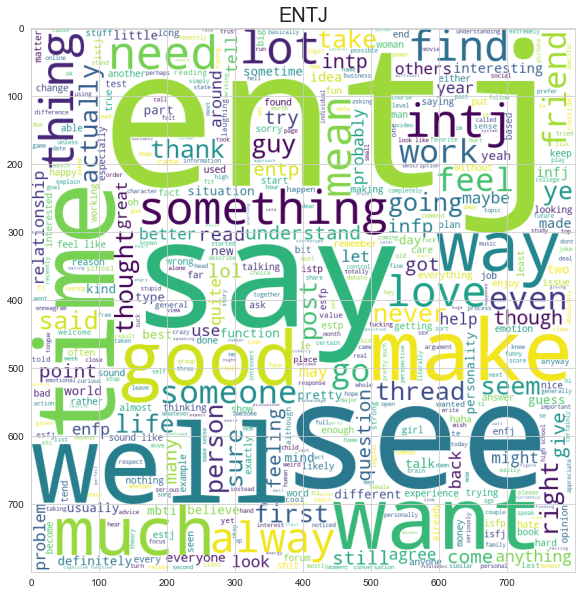

...

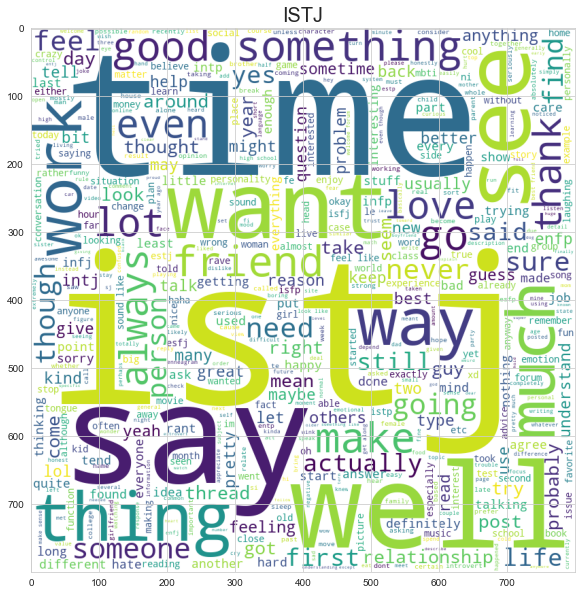

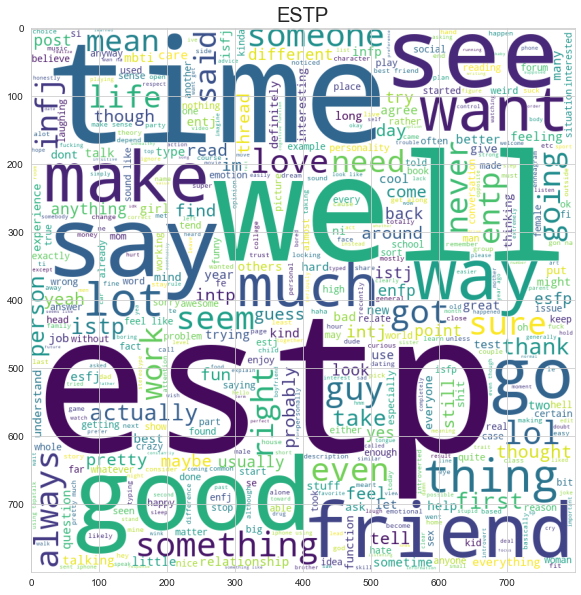

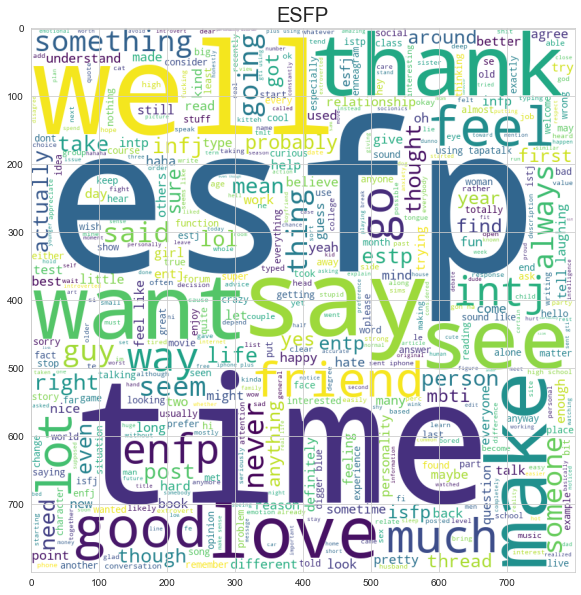

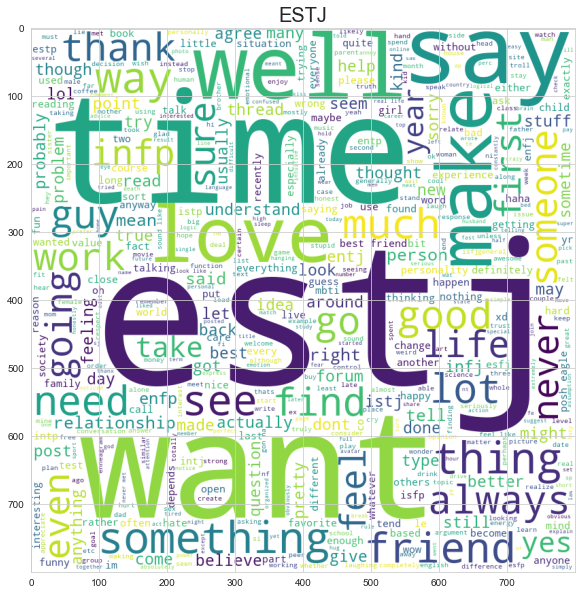

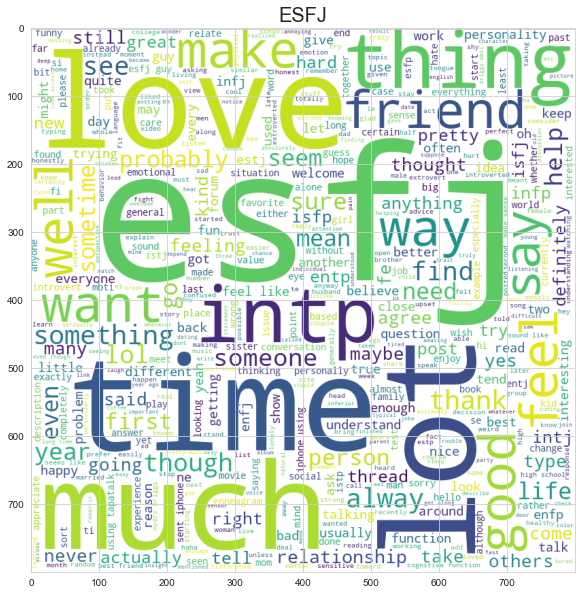

In [100]:
k=list(orgData['type'].unique())
for i in range(len(k)):
    lt=[j for j in orgData.clean_text[orgData['type']==k[i]]]
    word_cloud=WordCloud(width=800,height=800,background_color='white',max_words=500).generate(" ".join(lt))
    plt.figure(figsize=[10,10])
    plt.imshow(word_cloud)
    plt.title(k[i], fontsize=20)
    plt.show()

# Classifying Text Features by 16 MBTI Personality Classes

## Feature Extraction for Bag of Words

In [83]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [84]:
count_vect = CountVectorizer(ngram_range=(1, 2),stop_words=stop_update,max_features = 4000)

In [85]:
tfidf_vect = TfidfVectorizer(ngram_range=(1, 2),max_features = 4000)

In [86]:
X=count_vect.fit_transform(orgData['clean_text'])
Y=tfidf_vect.fit_transform(orgData['clean_text'])

In [87]:
# BOW
print(count_vect.get_feature_names())

['ability', 'able', 'absolute', 'absolutely', 'absolutely love', 'abstract', 'absurd', 'abuse', 'abusive', 'academic', 'accent', 'accept', 'acceptable', 'acceptance', 'accepted', 'accepting', 'access', 'accident', 'accidentally', 'accomplish', 'according', 'account', 'accurate', 'accurately', 'accused', 'achieve', 'acknowledge', 'acquaintance', 'across', 'act', 'act like', 'acted', 'acting', 'action', 'active', 'actively', 'activity', 'actor', 'actual', 'actually', 'actually get', 'actually like', 'actually pretty', 'actually quite', 'ad', 'adam', 'adapt', 'add', 'added', 'addicted', 'addiction', 'adding', 'addition', 'address', 'adhd', 'admire', 'admit', 'adorable', 'adore', 'adult', 'advance', 'advanced', 'advantage', 'adventure', 'advice', 'advise', 'advocate', 'affect', 'affect way', 'affected', 'affection', 'affectionate', 'affirmation', 'afford', 'afraid', 'afternoon', 'afterwards', 'age', 'aggressive', 'agnostic', 'ago', 'agree', 'agreed', 'ah', 'ahead', 'ahh', 'ai', 'aim', 'air

In [88]:
print(tfidf_vect.get_feature_names())

['ability', 'able', 'absolute', 'absolutely', 'absolutely love', 'abstract', 'absurd', 'abuse', 'abusive', 'academic', 'accent', 'accept', 'acceptable', 'acceptance', 'accepted', 'accepting', 'access', 'accident', 'accidentally', 'accomplish', 'according', 'account', 'accurate', 'accurately', 'accused', 'achieve', 'acknowledge', 'acquaintance', 'across', 'act', 'act like', 'acted', 'acting', 'action', 'active', 'actively', 'activity', 'actor', 'actual', 'actually', 'actually get', 'actually like', 'actually pretty', 'actually quite', 'ad', 'adam', 'adapt', 'add', 'added', 'addicted', 'addiction', 'adding', 'addition', 'address', 'adhd', 'admire', 'admit', 'adorable', 'adore', 'adult', 'advance', 'advanced', 'advantage', 'adventure', 'advice', 'advise', 'advocate', 'affect', 'affect way', 'affected', 'affection', 'affectionate', 'affirmation', 'afford', 'afraid', 'afternoon', 'afterwards', 'age', 'aggressive', 'agnostic', 'ago', 'agree', 'agreed', 'ah', 'ahead', 'ahh', 'ai', 'aim', 'air

In [89]:
#Get the position of every word in the BOW(Bag Of Words)
print(count_vect.vocabulary_)

{'enfp': 1028, 'intj': 1813, 'moment': 2310, 'top': 3631, 'ten': 3523, 'play': 2656, 'experience': 1143, 'life': 2007, 'repeat': 2933, 'today': 3617, 'may': 2219, 'perc': 2594, 'last': 1948, 'infj': 1744, 'friend': 1358, 'posted': 2701, 'facebook': 1175, 'suicide': 3429, 'next': 2413, 'day': 796, 'rest': 2958, 'peace': 2589, 'hello': 1600, 'enfj': 1026, 'sorry': 3278, 'hear': 1586, 'natural': 2371, 'relationship': 2910, 'time': 3592, 'every': 1097, 'existence': 1135, 'try': 3677, 'figure': 1260, 'hard': 1565, 'growth': 1525, 'welcome': 3877, 'stuff': 3403, 'game': 1390, 'set': 3116, 'match': 2210, 'least': 1983, 'minute': 2289, 'moving': 2333, 'leg': 1990, 'mean': 2228, 'sitting': 3191, 'desk': 858, 'chair': 499, 'weed': 3871, 'maybe': 2223, 'alternative': 119, 'basically': 294, 'come': 603, 'three': 3577, 'item': 1867, 'determined': 867, 'want': 3821, 'likely': 2061, 'use': 3753, 'given': 1446, 'cognitive': 590, 'function': 1383, 'left': 1989, 'indeed': 1735, 'video': 3793, 'good': 14

In [90]:
print(tfidf_vect.vocabulary_)

{'enfp': 1026, 'intj': 1808, 'moment': 2305, 'top': 3632, 'ten': 3512, 'play': 2651, 'experience': 1140, 'life': 2000, 'repeat': 2926, 'today': 3618, 'may': 2214, 'perc': 2589, 'last': 1941, 'infj': 1740, 'friend': 1355, 'posted': 2695, 'facebook': 1172, 'suicide': 3417, 'next': 2407, 'day': 796, 'rest': 2950, 'peace': 2583, 'hello': 1596, 'enfj': 1024, 'sorry': 3266, 'hear': 1582, 'natural': 2364, 'relationship': 2903, 'time': 3593, 'every': 1094, 'existence': 1132, 'try': 3678, 'figure': 1257, 'hard': 1560, 'growth': 1520, 'welcome': 3879, 'stuff': 3391, 'game': 1387, 'set': 3105, 'match': 2205, 'least': 1976, 'minute': 2285, 'moving': 2328, 'leg': 1983, 'mean': 2224, 'sitting': 3180, 'desk': 856, 'chair': 502, 'weed': 3873, 'maybe': 2218, 'alternative': 119, 'basically': 295, 'come': 606, 'three': 3579, 'item': 1860, 'determined': 865, 'type': 3708, 'want': 3824, 'likely': 2053, 'use': 3757, 'given': 1443, 'cognitive': 593, 'function': 1380, 'left': 1982, 'thing': 3553, 'indeed': 17

In [91]:
X.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [2, 1, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 2, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0]], dtype=int64)

In [92]:
X.todense()

matrix([[0, 0, 0, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0],
        [2, 1, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 2, 0, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0]], dtype=int64)

In [93]:
DTM=pd.DataFrame(X.toarray(),columns=count_vect.get_feature_names())
DTM.head()

,ability,able,absolute,absolutely,absolutely love,abstract,absurd,abuse,abusive,academic,...,younger,youngest,youre,youth,youtube,yr,yup,zero,zombie,zone
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,1,0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,2,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [94]:
DTM_1= pd.DataFrame(Y.toarray(),columns=tfidf_vect.get_feature_names())
DTM_1.head()

,ability,able,absolute,absolutely,absolutely love,abstract,absurd,abuse,abusive,academic,...,younger,youngest,youre,youth,youtube,yr,yup,zero,zombie,zone
0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,0.000000,0.028263,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2,0.093633,0.033864,0.000000,0.081397,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.062526,0.0,0.0,0.0
3,0.000000,0.059893,0.055621,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
4,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0


In [95]:
print(DTM.shape)
print(DTM_1.shape)

(8675, 4000)
(8675, 4000)


# Classifier Training


In [163]:
# Train-test split, using type variable as target and clean_text variable as predictor
X_train, X_test, y_train, y_test = train_test_split(orgData['clean_text'].values,orgData['type'].values,
                                                    test_size=0.30, random_state=42)
print('X_train ', X_train.shape, '\n', 'X_test ', X_test.shape, '\n', 'y_train ', y_train.shape, '\n', 
      'y_test', y_test.shape)

X_train  (6072,) 
 X_test  (2603,) 
 y_train  (6072,) 
 y_test (2603,)


There are 6072 cases in the training set, and 2603 cases in the testing set.

In [164]:
tfidf=TfidfVectorizer(ngram_range=(1, 2),stop_words=stop_update,max_features = 1000)

In [165]:
X_train_tfidf=tfidf.fit_transform(X_train)
X_train_tfidf

<6072x1000 sparse matrix of type '<class 'numpy.float64'>'
	with 1373306 stored elements in Compressed Sparse Row format>

In [166]:
X_train_tfidf.toarray()

array([[0.        , 0.03216215, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.05388023, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.02713032, 0.        , ..., 0.0362027 , 0.03667799,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.04875744, 0.        ,
        0.        ],
       [0.09534492, 0.        , 0.08284483, ..., 0.        , 0.        ,
        0.        ]])

# Truncated SVD
TruncatedSVD is a variant of principal component analysis (pca) used on sparse matrices to reduce dimensionality

In [167]:
from sklearn.decomposition import TruncatedSVD

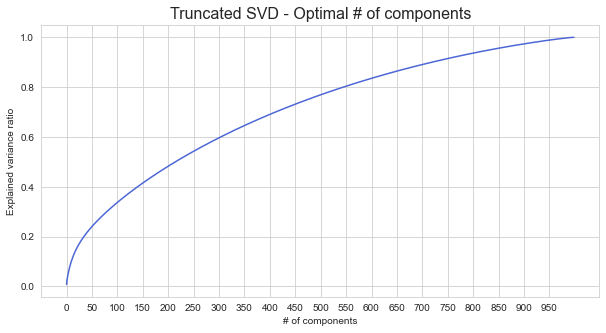

In [171]:
# Run Truncated SVD
# First use max components and graph the explained variance ratio to find cutoff point 
tsvd = TruncatedSVD(n_components=999)
tsvd.fit(X_train_tfidf)
plt.figure(figsize=[10,5])
plt.plot(range(999), tsvd.explained_variance_ratio_.cumsum())
plt.title("Truncated SVD - Optimal # of components", fontsize=16)
plt.xlabel("# of components")
plt.xticks([i for i in range(0,999,50)])
plt.ylabel("Explained variance ratio");

In [172]:
# Run a Truncated SVD with 50 components
tsvd = TruncatedSVD(n_components=50)
tsvd.fit(X_train_tfidf)
X_train_tsvd = tsvd.transform(X_train_tfidf)

X_test_tfidf = tfidf.transform(X_test)
X_test_tsvd = tsvd.transform(X_test_tfidf)

In [178]:
X_train_tsvd

array([[ 0.50370622,  0.03686847, -0.06144067, ...,  0.04917056,
        -0.04255562, -0.0955753 ],
       [ 0.50859647,  0.05593972,  0.05062548, ..., -0.04205109,
         0.05093661, -0.06298555],
       [ 0.28155285, -0.05311133, -0.01855646, ...,  0.02421964,
         0.00503297, -0.00719166],
       ...,
       [ 0.49249254,  0.15448024,  0.03518822, ...,  0.06991795,
        -0.01074928,  0.03549423],
       [ 0.58229322, -0.15262422,  0.00588338, ..., -0.00783319,
        -0.01877785,  0.04066749],
       [ 0.33798112,  0.03453797, -0.07747582, ...,  0.05226323,
         0.03641135,  0.0087294 ]])

In [152]:
#X_test_tfidf = tfidf.transform(X_test)

# Modelling

## Random Forest

In [240]:
from sklearn.ensemble import RandomForestClassifier

In [241]:
rfc = RandomForestClassifier(n_estimators=30, min_samples_leaf=50, oob_score=True, n_jobs= -1, random_state=24)
#rfc= RandomForestClassifier(n_estimators=30,random_state=0)
#rfc.fit(X_train_tfidf, y_train)
rfc.fit(X_train_tsvd, y_train)
print("TRAINING SET")
#print("Accuracy: ", rfc.score(X_train_tfidf, y_train))
print("Accuracy: ", rfc.score(X_train_tsvd, y_train))

print("TEST SET")
#print("Accuracy: ", rfc.score(X_test_tfidf, y_test))
print("Accuracy: ", rfc.score(X_test_tsvd, y_test))

TRAINING SET
Accuracy:  0.6147891963109354
TEST SET
Accuracy:  0.5532078371110257


## Parameter Tuning

In [242]:
from sklearn.model_selection import GridSearchCV

In [243]:
param_grid = { 
    'n_estimators': [100, 200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'min_samples_leaf': [40, 50, 80],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

In [247]:
#CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
#CV_rfc.fit(X_train_tfidf, y_train)
#CV_rfc.fit(X_train_tsvd, y_train)

In [248]:
#CV_rfc.best_params_

In [246]:
rfc = RandomForestClassifier(criterion='gini',n_estimators=500,min_samples_leaf=50,max_depth=8,max_features='auto', n_jobs= -1, random_state=24)
#rfc= RandomForestClassifier(n_estimators=30,random_state=0)
rfc.fit(X_train_tfidf, y_train)
print("TRAINING SET")
print("Accuracy: ", rfc.score(X_train_tfidf, y_train))


print("TEST SET")
print("Accuracy: ", rfc.score(X_test_tfidf, y_test))

TRAINING SET
Accuracy:  0.5587944664031621
TEST SET
Accuracy:  0.5101805608912793


In [109]:
cm=confusion_matrix(y_test,rfc.predict(X_test_tfidf))
print(cm)

[[  0   2   0   0   0   0   0   0  12  35   3   4   0   0   0   0]
 [  0  57   0   4   0   0   0   0  27  90   9   9   0   0   0   0]
 [  0   2   3   3   0   0   0   0   5  19  14  12   0   0   0   0]
 [  0   4   0  46   0   0   0   0  33  51  11  56   0   0   0   0]
 [  0   0   0   1   0   0   0   0   1   5   0   3   0   0   0   0]
 [  0   2   1   1   0   0   0   0   1   2   2   0   0   0   0   0]
 [  0   0   0   1   0   0   0   0   2  12   0   2   0   0   0   0]
 [  0   0   0   0   0   0   0   0   8  13   0   4   0   0   0   0]
 [  0   1   1   2   0   0   0   0 278 119  14  19   0   0   0   0]
 [  0   0   0   2   0   0   0   0  46 478  11  28   0   0   0   1]
 [  0   1   0   0   0   0   0   0  34  70 170  36   0   0   0   0]
 [  0   1   0   2   0   0   0   0  20  68   9 304   0   0   0   0]
 [  0   0   0   1   0   0   0   0  10  38   3   9   0   0   0   0]
 [  0   1   0   0   0   0   0   0   7  60   5  11   0   0   0   0]
 [  0   1   0   0   0   0   0   0   4  47   7  11   0   0   0 

In [110]:
# Convert confusion matrix to a dataframe to prepare it for heatmapping
cm_rfc = np.array(confusion_matrix(y_test, rfc.predict(X_test_tfidf)))

cm_randomforest = pd.DataFrame(cm_rfc, index=['ENFJ', 'ENFP', 'ENTJ', 'ENTP', 'ESFJ', 'ESFP',
                                       'ESTJ', 'ESTP', 'INFJ', 'INFP', 'INTJ', 'INTP',
                                       'ISFJ', 'ISFP', 'ISTJ', 'ISTP'], 
                            columns=['predict_ENFJ','predict_ENFP','predict_ENTJ',
                                     'predict_ENTP','predict_ESFJ','predict_ESFP',
                                     'predict_ESTJ','predict_ESTP','predict_INFJ',
                                     'predict_INFP','predict_INTJ','predict_INTP',
                                     'predict_ISFJ','predict_ISFP','predict_ISTJ',
                                     'predict_ISTP'])
cm_randomforest

,predict_ENFJ,predict_ENFP,predict_ENTJ,predict_ENTP,predict_ESFJ,predict_ESFP,predict_ESTJ,predict_ESTP,predict_INFJ,predict_INFP,predict_INTJ,predict_INTP,predict_ISFJ,predict_ISFP,predict_ISTJ,predict_ISTP
ENFJ,0,2,0,0,0,0,0,0,12,35,3,4,0,0,0,0
ENFP,0,57,0,4,0,0,0,0,27,90,9,9,0,0,0,0
ENTJ,0,2,3,3,0,0,0,0,5,19,14,12,0,0,0,0
ENTP,0,4,0,46,0,0,0,0,33,51,11,56,0,0,0,0
ESFJ,0,0,0,1,0,0,0,0,1,5,0,3,0,0,0,0
ESFP,0,2,1,1,0,0,0,0,1,2,2,0,0,0,0,0
ESTJ,0,0,0,1,0,0,0,0,2,12,0,2,0,0,0,0
ESTP,0,0,0,0,0,0,0,0,8,13,0,4,0,0,0,0
INFJ,0,1,1,2,0,0,0,0,278,119,14,19,0,0,0,0
INFP,0,0,0,2,0,0,0,0,46,478,11,28,0,0,0,1


In [206]:
print("Classification Report:")
print(classification_report(y_test, rfc.predict(X_test_tfidf)))

Classification Report:
              precision    recall  f1-score   support

        ENFJ       0.00      0.00      0.00        56
        ENFP       0.83      0.20      0.32       196
        ENTJ       0.00      0.00      0.00        58
        ENTP       0.81      0.23      0.36       201
        ESFJ       0.00      0.00      0.00        10
        ESFP       0.00      0.00      0.00         9
        ESTJ       0.00      0.00      0.00        17
        ESTP       0.00      0.00      0.00        25
        INFJ       0.58      0.63      0.60       434
        INFP       0.39      0.92      0.55       566
        INTJ       0.67      0.53      0.59       311
        INTP       0.64      0.71      0.67       404
        ISFJ       0.00      0.00      0.00        61
        ISFP       0.00      0.00      0.00        84
        ISTJ       0.00      0.00      0.00        70
        ISTP       0.00      0.00      0.00       101

    accuracy                           0.51      2603
   

C:\Users\shake\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shake\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shake\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Confusion Matrix for Random Forest

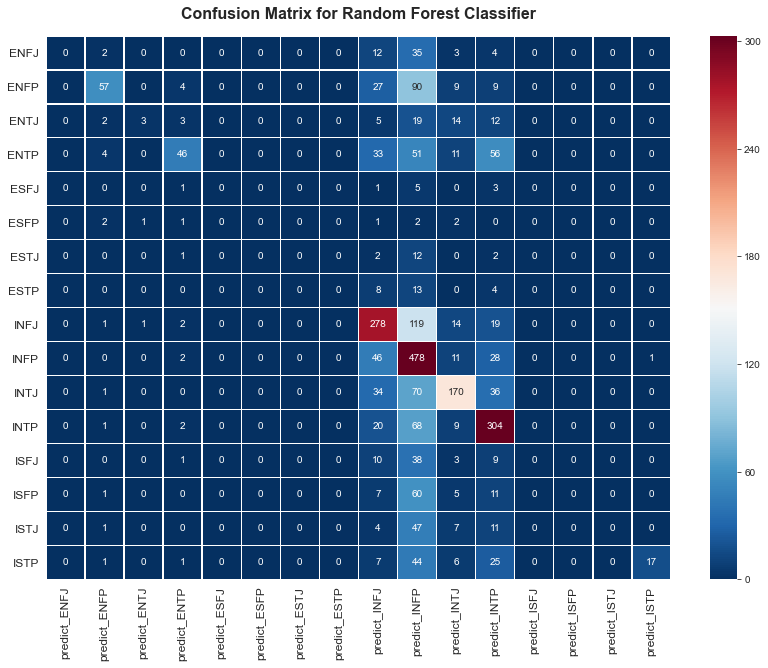

In [111]:
# Create confusion matrix heatmap of Random Forest Classifier model 
fig, ax = plt.subplots(figsize=(14,10)) 
plt.title('Confusion Matrix for Random Forest Classifier', fontsize=16,
          fontweight='bold', y=1.02)
sns.heatmap(cm_randomforest, robust=True, annot=True, linewidth=0.5, 
            fmt='', cmap='RdBu_r', vmax=303, ax=ax)
plt.xticks(fontsize=12)
plt.yticks(rotation=0, fontsize=12);

In the heatmapped confusion matrix above, it is clear that the Random Forest Classifier model is making predictions only within four of the sixteen classes: INFJ, INFP, INTJ, and INTP, which are the most abundant classes in the dataset. The other twelve categories receive no predictions from this model at all. This model is not suited to predicting classes outside of the ones with the highest frequency.


## MultinomialNB

In [179]:
from sklearn.naive_bayes import MultinomialNB

#train classifier mnb
mnb = MultinomialNB().fit(X_train_tfidf, y_train)
#mnb = MultinomialNB().fit(X_train_tsvd, y_train)

In [181]:
#test classifier against test data.
y_pred = mnb.predict(X_test_tfidf)
#y_pred = mnb.predict(X_test_tsvd)
mnb_acc=accuracy_score(y_test,y_pred)
print(mnb_acc)

0.42758355743373033


In [182]:
#confusion Matrix
cm=confusion_matrix(y_test,y_pred)
cm

array([[  0,   0,   0,   0,   0,   0,   0,   0,  17,  37,   2,   0,   0,
          0,   0,   0],
       [  0,  13,   0,   1,   0,   0,   0,   0,  35, 131,  10,   6,   0,
          0,   0,   0],
       [  0,   0,   0,   1,   0,   0,   0,   0,  11,  22,  14,  10,   0,
          0,   0,   0],
       [  0,   1,   0,  33,   0,   0,   0,   0,  43,  60,  10,  54,   0,
          0,   0,   0],
       [  0,   0,   0,   1,   0,   0,   0,   0,   2,   7,   0,   0,   0,
          0,   0,   0],
       [  0,   1,   0,   0,   0,   0,   0,   0,   0,   4,   1,   3,   0,
          0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   1,  14,   0,   2,   0,
          0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   8,  11,   1,   5,   0,
          0,   0,   0],
       [  0,   1,   0,   0,   0,   0,   0,   0, 210, 201,   9,  13,   0,
          0,   0,   0],
       [  0,   1,   0,   0,   0,   0,   0,   0,  48, 489,   9,  19,   0,
          0,   0,   0],
       [  0,   0,   0,   2,   

In [183]:
# Convert confusion matrix to a dataframe to prepare it for heatmapping
cm_mnb = np.array(confusion_matrix(y_test, y_pred))

cm_multinomialNB = pd.DataFrame(cm_mnb, index=['ENFJ', 'ENFP', 'ENTJ', 'ENTP', 'ESFJ', 'ESFP',
                                       'ESTJ', 'ESTP', 'INFJ', 'INFP', 'INTJ', 'INTP',
                                       'ISFJ', 'ISFP', 'ISTJ', 'ISTP'], 
                            columns=['predict_ENFJ','predict_ENFP','predict_ENTJ',
                                     'predict_ENTP','predict_ESFJ','predict_ESFP',
                                     'predict_ESTJ','predict_ESTP','predict_INFJ',
                                     'predict_INFP','predict_INTJ','predict_INTP',
                                     'predict_ISFJ','predict_ISFP','predict_ISTJ',
                                     'predict_ISTP'])
cm_multinomialNB

,predict_ENFJ,predict_ENFP,predict_ENTJ,predict_ENTP,predict_ESFJ,predict_ESFP,predict_ESTJ,predict_ESTP,predict_INFJ,predict_INFP,predict_INTJ,predict_INTP,predict_ISFJ,predict_ISFP,predict_ISTJ,predict_ISTP
ENFJ,0,0,0,0,0,0,0,0,17,37,2,0,0,0,0,0
ENFP,0,13,0,1,0,0,0,0,35,131,10,6,0,0,0,0
ENTJ,0,0,0,1,0,0,0,0,11,22,14,10,0,0,0,0
ENTP,0,1,0,33,0,0,0,0,43,60,10,54,0,0,0,0
ESFJ,0,0,0,1,0,0,0,0,2,7,0,0,0,0,0,0
ESFP,0,1,0,0,0,0,0,0,0,4,1,3,0,0,0,0
ESTJ,0,0,0,0,0,0,0,0,1,14,0,2,0,0,0,0
ESTP,0,0,0,0,0,0,0,0,8,11,1,5,0,0,0,0
INFJ,0,1,0,0,0,0,0,0,210,201,9,13,0,0,0,0
INFP,0,1,0,0,0,0,0,0,48,489,9,19,0,0,0,0


In [184]:
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

        ENFJ       0.00      0.00      0.00        56
        ENFP       0.76      0.07      0.12       196
        ENTJ       0.00      0.00      0.00        58
        ENTP       0.82      0.16      0.27       201
        ESFJ       0.00      0.00      0.00        10
        ESFP       0.00      0.00      0.00         9
        ESTJ       0.00      0.00      0.00        17
        ESTP       0.00      0.00      0.00        25
        INFJ       0.42      0.48      0.45       434
        INFP       0.35      0.86      0.49       566
        INTJ       0.62      0.38      0.47       311
        INTP       0.56      0.62      0.59       404
        ISFJ       0.00      0.00      0.00        61
        ISFP       0.00      0.00      0.00        84
        ISTJ       0.00      0.00      0.00        70
        ISTP       0.00      0.00      0.00       101

    accuracy                           0.43      2603
   

C:\Users\shake\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shake\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shake\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Confusion Matrix for MultinomialNB

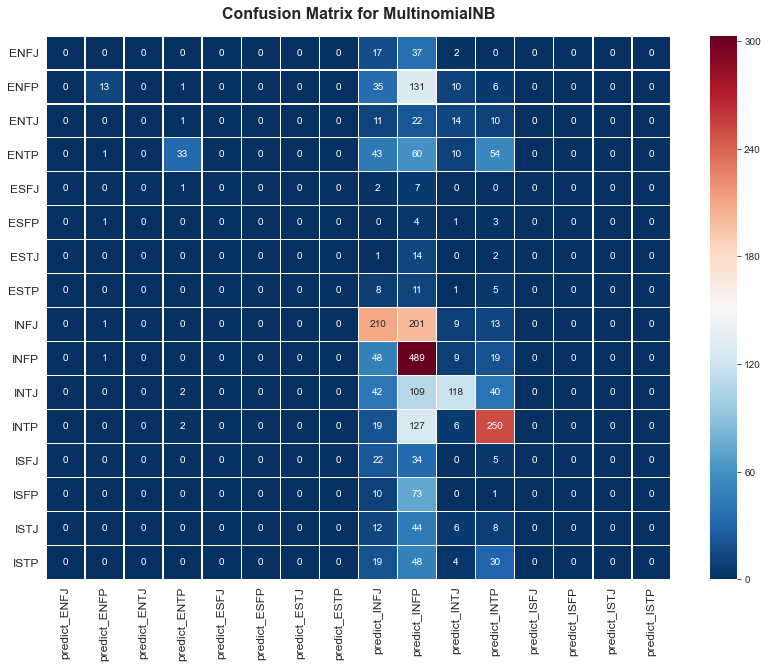

In [185]:
# Create confusion matrix heatmap of Random Forest Classifier model 
fig, ax = plt.subplots(figsize=(14,10)) 
plt.title('Confusion Matrix for MultinomialNB', fontsize=16,
          fontweight='bold', y=1.02)
sns.heatmap(cm_multinomialNB, robust=True, annot=True, linewidth=0.5, 
            fmt='', cmap='RdBu_r', vmax=303, ax=ax)
plt.xticks(fontsize=12)
plt.yticks(rotation=0, fontsize=12);

# Logistic Regression

In [191]:
from sklearn.linear_model import LogisticRegression

#train classifier lr
lr = LogisticRegression(solver='liblinear', penalty='l2', max_iter=100, C=1)
#lr.fit(X_train_tfidf, y_train)
lr.fit(X_train_tsvd, y_train)

LogisticRegression(C=1, solver='liblinear')

In [192]:
#y_pred=lr.predict(X_test_tfidf)
y_pred=lr.predict(X_test_tsvd)

In [193]:
#test classifier against test data.
lr_acc=accuracy_score(y_test,y_pred)
print(lr_acc)

0.638109873223204


In [194]:
#confusion Matrix
cm=confusion_matrix(y_test,y_pred)
cm

array([[ 11,   8,   0,   0,   0,   0,   0,   0,  11,  18,   2,   5,   0,
          0,   1,   0],
       [  0, 103,   0,   8,   0,   0,   0,   0,  20,  39,  17,   8,   0,
          0,   0,   1],
       [  2,   3,  21,   5,   0,   0,   0,   0,   4,   3,  13,   5,   0,
          2,   0,   0],
       [  0,   8,   0, 113,   0,   0,   0,   0,  20,  11,  16,  30,   0,
          1,   2,   0],
       [  0,   0,   0,   2,   0,   0,   0,   0,   0,   2,   0,   5,   0,
          0,   1,   0],
       [  0,   2,   1,   1,   0,   0,   0,   0,   0,   2,   2,   1,   0,
          0,   0,   0],
       [  0,   2,   1,   1,   0,   0,   0,   0,   1,   7,   2,   3,   0,
          0,   0,   0],
       [  0,   1,   0,   2,   0,   0,   0,   1,   3,   6,   3,   5,   0,
          0,   0,   4],
       [  0,   8,   0,   9,   0,   0,   0,   0, 303,  70,  20,  23,   0,
          0,   0,   1],
       [  3,  13,   0,   8,   0,   0,   0,   0,  21, 473,  16,  27,   0,
          3,   0,   2],
       [  0,   4,   2,   6,   

In [195]:
# Convert confusion matrix to a dataframe to prepare it for heatmapping
cm_lr = np.array(confusion_matrix(y_test, y_pred))

cm_logisticreg = pd.DataFrame(cm_lr, index=['ENFJ', 'ENFP', 'ENTJ', 'ENTP', 'ESFJ', 'ESFP',
                                       'ESTJ', 'ESTP', 'INFJ', 'INFP', 'INTJ', 'INTP',
                                       'ISFJ', 'ISFP', 'ISTJ', 'ISTP'], 
                            columns=['predict_ENFJ','predict_ENFP','predict_ENTJ',
                                     'predict_ENTP','predict_ESFJ','predict_ESFP',
                                     'predict_ESTJ','predict_ESTP','predict_INFJ',
                                     'predict_INFP','predict_INTJ','predict_INTP',
                                     'predict_ISFJ','predict_ISFP','predict_ISTJ',
                                     'predict_ISTP'])
cm_logisticreg

,predict_ENFJ,predict_ENFP,predict_ENTJ,predict_ENTP,predict_ESFJ,predict_ESFP,predict_ESTJ,predict_ESTP,predict_INFJ,predict_INFP,predict_INTJ,predict_INTP,predict_ISFJ,predict_ISFP,predict_ISTJ,predict_ISTP
ENFJ,11,8,0,0,0,0,0,0,11,18,2,5,0,0,1,0
ENFP,0,103,0,8,0,0,0,0,20,39,17,8,0,0,0,1
ENTJ,2,3,21,5,0,0,0,0,4,3,13,5,0,2,0,0
ENTP,0,8,0,113,0,0,0,0,20,11,16,30,0,1,2,0
ESFJ,0,0,0,2,0,0,0,0,0,2,0,5,0,0,1,0
ESFP,0,2,1,1,0,0,0,0,0,2,2,1,0,0,0,0
ESTJ,0,2,1,1,0,0,0,0,1,7,2,3,0,0,0,0
ESTP,0,1,0,2,0,0,0,1,3,6,3,5,0,0,0,4
INFJ,0,8,0,9,0,0,0,0,303,70,20,23,0,0,0,1
INFP,3,13,0,8,0,0,0,0,21,473,16,27,0,3,0,2


In [196]:
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

        ENFJ       0.65      0.20      0.30        56
        ENFP       0.64      0.53      0.58       196
        ENTJ       0.81      0.36      0.50        58
        ENTP       0.68      0.56      0.62       201
        ESFJ       0.00      0.00      0.00        10
        ESFP       0.00      0.00      0.00         9
        ESTJ       0.00      0.00      0.00        17
        ESTP       1.00      0.04      0.08        25
        INFJ       0.68      0.70      0.69       434
        INFP       0.60      0.84      0.70       566
        INTJ       0.62      0.70      0.65       311
        INTP       0.62      0.80      0.70       404
        ISFJ       0.87      0.21      0.34        61
        ISFP       0.63      0.23      0.33        84
        ISTJ       0.69      0.16      0.26        70
        ISTP       0.78      0.52      0.63       101

    accuracy                           0.64      2603
   

C:\Users\shake\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shake\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shake\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Confusion Matrix for Logistic Regression

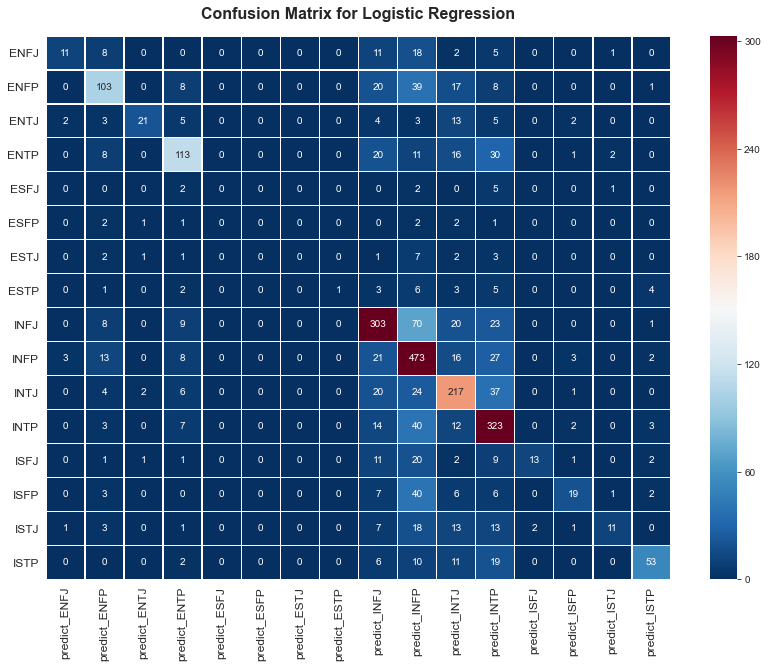

In [197]:
# Create confusion matrix heatmap of Random Forest Classifier model 
fig, ax = plt.subplots(figsize=(14,10)) 
plt.title('Confusion Matrix for Logistic Regression', fontsize=16,
          fontweight='bold', y=1.02)
sns.heatmap(cm_logisticreg, robust=True, annot=True, linewidth=0.5, 
            fmt='', cmap='RdBu_r', vmax=303, ax=ax)
plt.xticks(fontsize=12)
plt.yticks(rotation=0, fontsize=12);

# SGD Classifier

In [225]:
from sklearn.linear_model import SGDClassifier

#train classifier sgdc
sgdc = SGDClassifier()
#sgdc.fit(X_train_tfidf, y_train)
sgdc.fit(X_train_tsvd, y_train)

SGDClassifier()

In [226]:
#test classifier against test data.
#y_pred=sgdc.predict(X_test_tfidf)
y_pred=sgdc.predict(X_test_tsvd)
sgdc_acc=accuracy_score(y_test,y_pred)
print(sgdc_acc)

0.6769112562427968


# Parameter tuning

In [227]:
parameters_2 = {
    'penalty': ['l1'],
    'l1_ratio': [0.15, 0.3, 0.5],
    'max_iter': [10,50, 100,150,200],
    'loss': ['hinge', 'log'],
    'n_jobs': [-1]
}


In [228]:
sgdc_cv2 = GridSearchCV(sgdc, parameters_2, cv=5)
#sgdc_cv2.fit(X_train_tfidf, y_train)
sgdc_cv2.fit(X_train_tsvd, y_train)

C:\Users\shake\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:573: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  ConvergenceWarning)
C:\Users\shake\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:573: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  ConvergenceWarning)
C:\Users\shake\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:573: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  ConvergenceWarning)
C:\Users\shake\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:573: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  ConvergenceWarning)
C:\Users\shake\Anaconda3\lib\site-packag

GridSearchCV(cv=5, estimator=SGDClassifier(),
             param_grid={'l1_ratio': [0.15, 0.3, 0.5], 'loss': ['hinge', 'log'],
                         'max_iter': [10, 50, 100, 150, 200], 'n_jobs': [-1],
                         'penalty': ['l1']})

In [229]:
sgdc_cv2.best_params_

{'l1_ratio': 0.15,
 'loss': 'hinge',
 'max_iter': 200,
 'n_jobs': -1,
 'penalty': 'l1'}

In [232]:
#train classifier sgdc
sgdc = SGDClassifier(l1_ratio=0.15,loss='hinge',max_iter=200,n_jobs=-1,penalty='l1')
#sgdc.fit(X_train_tfidf, y_train)
sgdc.fit(X_train_tsvd, y_train)

SGDClassifier(max_iter=200, n_jobs=-1, penalty='l1')

In [233]:
#test classifier against test data.
#y_pred=sgdc.predict(X_test_tfidf)
y_pred=sgdc.predict(X_test_tsvd)
sgdc_acc=accuracy_score(y_test,y_pred)
print(sgdc_acc)

0.6703803303880138


No perfomance change after tuning

In [234]:
cm=confusion_matrix(y_test,y_pred)
cm

array([[ 12,  14,   0,   2,   0,   1,   0,   0,   7,  11,   4,   3,   0,
          0,   1,   1],
       [  1, 136,   0,  11,   0,   0,   0,   1,   5,  18,  17,   5,   0,
          1,   0,   1],
       [  1,   3,  29,   5,   0,   1,   0,   0,   1,   3,  11,   2,   0,
          2,   0,   0],
       [  0,  13,   1, 130,   0,   0,   0,   2,  11,   7,  16,  18,   0,
          1,   2,   0],
       [  0,   0,   0,   2,   0,   0,   0,   0,   0,   2,   1,   3,   1,
          0,   1,   0],
       [  0,   2,   2,   1,   0,   0,   0,   0,   0,   2,   1,   0,   0,
          1,   0,   0],
       [  0,   2,   2,   1,   0,   1,   0,   0,   1,   7,   1,   2,   0,
          0,   0,   0],
       [  0,   0,   0,   4,   0,   0,   0,   9,   1,   1,   4,   4,   0,
          0,   0,   2],
       [  0,  20,   4,  22,   0,   1,   0,   2, 278,  51,  35,  16,   2,
          1,   1,   1],
       [  3,  27,   0,  13,   0,   3,   0,   0,  18, 447,  26,  19,   1,
          6,   1,   2],
       [  0,  16,   4,   9,   

In [235]:
# Convert confusion matrix to a dataframe to prepare it for heatmapping
cm_sgdc = np.array(confusion_matrix(y_test, y_pred))

cm_stochastic = pd.DataFrame(cm_sgdc, index=['ENFJ', 'ENFP', 'ENTJ', 'ENTP', 'ESFJ', 'ESFP',
                                       'ESTJ', 'ESTP', 'INFJ', 'INFP', 'INTJ', 'INTP',
                                       'ISFJ', 'ISFP', 'ISTJ', 'ISTP'], 
                            columns=['predict_ENFJ','predict_ENFP','predict_ENTJ',
                                     'predict_ENTP','predict_ESFJ','predict_ESFP',
                                     'predict_ESTJ','predict_ESTP','predict_INFJ',
                                     'predict_INFP','predict_INTJ','predict_INTP',
                                     'predict_ISFJ','predict_ISFP','predict_ISTJ',
                                     'predict_ISTP'])
cm_stochastic

,predict_ENFJ,predict_ENFP,predict_ENTJ,predict_ENTP,predict_ESFJ,predict_ESFP,predict_ESTJ,predict_ESTP,predict_INFJ,predict_INFP,predict_INTJ,predict_INTP,predict_ISFJ,predict_ISFP,predict_ISTJ,predict_ISTP
ENFJ,12,14,0,2,0,1,0,0,7,11,4,3,0,0,1,1
ENFP,1,136,0,11,0,0,0,1,5,18,17,5,0,1,0,1
ENTJ,1,3,29,5,0,1,0,0,1,3,11,2,0,2,0,0
ENTP,0,13,1,130,0,0,0,2,11,7,16,18,0,1,2,0
ESFJ,0,0,0,2,0,0,0,0,0,2,1,3,1,0,1,0
ESFP,0,2,2,1,0,0,0,0,0,2,1,0,0,1,0,0
ESTJ,0,2,2,1,0,1,0,0,1,7,1,2,0,0,0,0
ESTP,0,0,0,4,0,0,0,9,1,1,4,4,0,0,0,2
INFJ,0,20,4,22,0,1,0,2,278,51,35,16,2,1,1,1
INFP,3,27,0,13,0,3,0,0,18,447,26,19,1,6,1,2


In [236]:
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

        ENFJ       0.63      0.21      0.32        56
        ENFP       0.52      0.69      0.60       196
        ENTJ       0.64      0.50      0.56        58
        ENTP       0.58      0.65      0.61       201
        ESFJ       0.00      0.00      0.00        10
        ESFP       0.00      0.00      0.00         9
        ESTJ       0.00      0.00      0.00        17
        ESTP       0.45      0.36      0.40        25
        INFJ       0.77      0.64      0.70       434
        INFP       0.72      0.79      0.75       566
        INTJ       0.57      0.75      0.65       311
        INTP       0.73      0.77      0.75       404
        ISFJ       0.80      0.64      0.71        61
        ISFP       0.70      0.44      0.54        84
        ISTJ       0.75      0.30      0.43        70
        ISTP       0.82      0.60      0.70       101

    accuracy                           0.67      2603
   

C:\Users\shake\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shake\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\shake\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Confusion Matrix for SGD Classifier

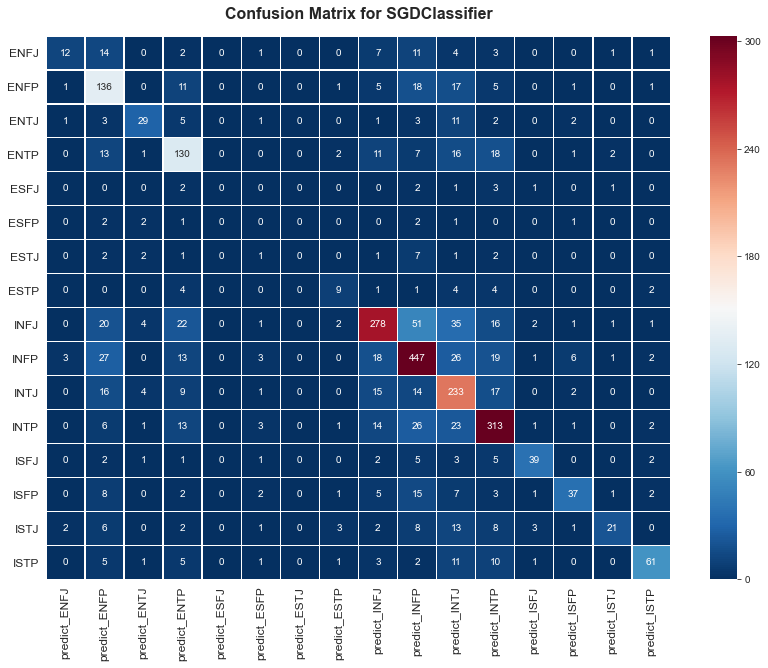

In [237]:
# Create confusion matrix heatmap of Random Forest Classifier model 
fig, ax = plt.subplots(figsize=(14,10)) 
plt.title('Confusion Matrix for SGDClassifier', fontsize=16,
          fontweight='bold', y=1.02)
sns.heatmap(cm_stochastic, robust=True, annot=True, linewidth=0.5, 
            fmt='', cmap='RdBu_r', vmax=303, ax=ax)
plt.xticks(fontsize=12)
plt.yticks(rotation=0, fontsize=12);

In [225]:
orgData['type'].values

array(['INFJ', 'ENTP', 'INTP', ..., 'INTP', 'INFP', 'INFP'], dtype=object)

# Using Neural Networks

In [378]:
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras import regularizers

In [379]:
orgData.head()

,type,posts,clean_text,clean_text_no_type_ref,I/E,N/S,F/T,P/J,words_per_comment_unclean,words_per_comment_clean
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,enfp intj moment sportscenter top ten play pra...,moments sportscenter top ten plays pranks life...,1,1,1,0,556,293
1,ENTP,'I'm finding the lack of me in these posts ver...,finding lack post alarming sex boring position...,finding lack posts alarming sex boring positio...,0,1,0,1,1170,526
2,INTP,'Good one _____ https://www.youtube.com/wat...,good course say blessing curse absolutely posi...,good one course say know blessing curse absolu...,1,1,0,1,836,400
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",wouldear intp enjoyed conversation day esoteri...,wouldear enjoyed conversation day esoteric gab...,1,1,0,0,1064,489
4,ENTJ,'You're fired.|||That's another silly misconce...,fired another silly misconception approaching ...,fired another silly misconception approaching ...,0,1,0,0,967,442


In [380]:
posts=orgData['clean_text']
ptypes=orgData['type']

In [381]:
n_tfidf = CountVectorizer(ngram_range=(1, 3),stop_words=stop_update,max_features = 1000)

In [382]:
n_tfidf_posts=n_tfidf.fit_transform(posts)

In [383]:
n_tfidf_posts

<8675x1000 sparse matrix of type '<class 'numpy.int64'>'
	with 1963675 stored elements in Compressed Sparse Row format>

In [384]:
from sklearn.decomposition import TruncatedSVD

In [385]:
tsvd = TruncatedSVD(n_components=200)
tposts = tsvd.fit_transform(n_tfidf_posts)

In [386]:
#converting types in to numerical
n_ptypes= pd.get_dummies(ptypes)

In [387]:
n_ptypes.head()

,ENFJ,ENFP,ENTJ,ENTP,ESFJ,ESFP,ESTJ,ESTP,INFJ,INFP,INTJ,INTP,ISFJ,ISFP,ISTJ,ISTP
0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [388]:
X_train, X_test, y_train, y_test = train_test_split(tposts,n_ptypes,test_size=0.1,stratify=n_ptypes,random_state=42)

In [389]:
ptypes.loc[0]

'INFJ'

In [390]:
#x_train, x_test, y_train, y_test = train_test_split(tposts, ptype, test_size=0.1, stratify=ptype, random_state=42)

In [391]:
X_train.shape , y_train.shape

((7807, 200), (7807, 16))

In [392]:
X_test.shape , y_test.shape

((868, 200), (868, 16))

In [393]:
y_train.values

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [394]:
#model architecture
mymodel = Sequential([Dense(321, activation='relu', kernel_regularizer=regularizers.l2(0.01), input_shape = (X_train[0].shape)),
                    Dropout(0.5, noise_shape=None, seed=None),
                    Dense(152, activation='relu'),
                    Dropout(0.5, noise_shape=None, seed=None),
                    Dense(16, activation='softmax')])

In [395]:
mymodel.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 321)               64521     
_________________________________________________________________
dropout_2 (Dropout)          (None, 321)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 152)               48944     
_________________________________________________________________
dropout_3 (Dropout)          (None, 152)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 16)                2448      
Total params: 115,913
Trainable params: 115,913
Non-trainable params: 0
_________________________________________________________________


In [396]:
adam = tf.keras.optimizers.Adam(lr = 0.001)
# loss = 'sparse_categorical_crossentropy',
mymodel.compile(loss = 'categorical_crossentropy',
              optimizer = adam,
              metrics = ['accuracy'])

In [397]:
history = mymodel.fit(tposts, n_ptypes, epochs=30, validation_split = 0.2, verbose=2)

Epoch 1/30
217/217 - 1s - loss: 4.1605 - accuracy: 0.2869 - val_loss: 2.9907 - val_accuracy: 0.5112
Epoch 2/30
217/217 - 0s - loss: 2.5946 - accuracy: 0.4800 - val_loss: 2.1129 - val_accuracy: 0.5919
Epoch 3/30
217/217 - 1s - loss: 2.0149 - accuracy: 0.5561 - val_loss: 1.7807 - val_accuracy: 0.6248
Epoch 4/30
217/217 - 0s - loss: 1.7463 - accuracy: 0.6086 - val_loss: 1.6457 - val_accuracy: 0.6352
Epoch 5/30
217/217 - 1s - loss: 1.6357 - accuracy: 0.6203 - val_loss: 1.5905 - val_accuracy: 0.6490
Epoch 6/30
217/217 - 0s - loss: 1.5552 - accuracy: 0.6373 - val_loss: 1.5694 - val_accuracy: 0.6490
Epoch 7/30
217/217 - 0s - loss: 1.5287 - accuracy: 0.6437 - val_loss: 1.5586 - val_accuracy: 0.6542
Epoch 8/30
217/217 - 0s - loss: 1.5038 - accuracy: 0.6500 - val_loss: 1.5691 - val_accuracy: 0.6536
Epoch 9/30
217/217 - 0s - loss: 1.4806 - accuracy: 0.6563 - val_loss: 1.5733 - val_accuracy: 0.6461
Epoch 10/30
217/217 - 1s - loss: 1.4596 - accuracy: 0.6660 - val_loss: 1.5829 - val_accuracy: 0.6380

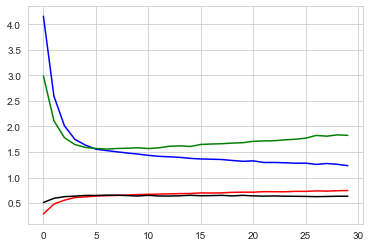

In [398]:
plt.plot(history.epoch, history.history['loss'], 'b',
        history.epoch, history.history['accuracy'], 'r',
        history.epoch, history.history['val_loss'], 'g',
        history.epoch, history.history['val_accuracy'], 'k')

In [399]:
mymodel.evaluate(X_test, y_test)

28/28 [==============================] - 0s 1ms/step - loss: 1.0306 - accuracy: 0.8318


[1.0306016206741333, 0.8317972421646118]

# Classifying Text Features by Class Within Each Axis

In [254]:
from imblearn.over_sampling import SMOTE

# Using mbti dataset with reference

In [255]:
# Train-test splits, using type variables as target and posts variable as predictor
# Introversion - Extroversion
X_train_IE, X_test_IE, y_train_IE, y_test_IE = train_test_split(orgData['clean_text'].values,
                                                   orgData['I/E'].values,
                                                   test_size=0.30, random_state=42)
# Intuition - Sensing
X_train_NS, X_test_NS, y_train_NS, y_test_NS = train_test_split(orgData['clean_text'].values,
                                                   orgData['N/S'].values,
                                                   test_size=0.30, random_state=42)
# Thinking - Feeling
X_train_TF, X_test_TF, y_train_TF, y_test_TF = train_test_split(orgData['clean_text'].values,
                                                   orgData['F/T'].values,
                                                   test_size=0.30, random_state=42)
# Judging - Perceiving
X_train_JP, X_test_JP, y_train_JP, y_test_JP = train_test_split(orgData['clean_text'].values,
                                                   orgData['P/J'].values,
                                                   test_size=0.30, random_state=42)

Use Truncated SVD to determine optimal number of components for the binary classifications

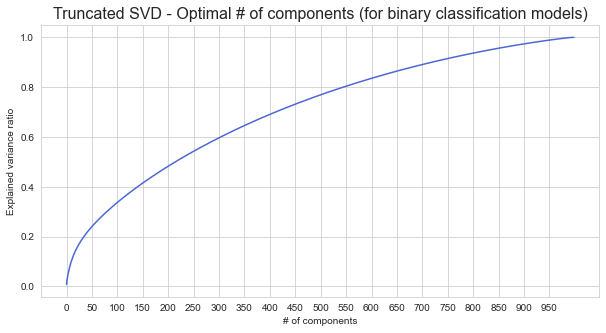

In [258]:
# First run CountVectorizer on the X train/test ('posts' column) - using I-E axis as reference
tf_idf = TfidfVectorizer(stop_words=stop_update, ngram_range=(1,2), max_features=1000)
tf_idf.fit(X_train_IE)
X_train_IE_tf_idf = tf_idf.transform(X_train_IE)

# Use max components and graph the explained variance ratio to find cutoff point 
tsvd = TruncatedSVD(n_components=999)
tsvd.fit(X_train_IE_tf_idf)
plt.figure(figsize=[10,5])
plt.plot(range(999), tsvd.explained_variance_ratio_.cumsum())
plt.title("Truncated SVD - Optimal # of components (for binary classification models)", fontsize=16)
plt.xlabel("# of components")
plt.xticks([i for i in range(0,999,50)])
plt.ylabel("Explained variance ratio");

In [260]:
from sklearn.pipeline import make_pipeline

In [261]:
# Create pipeline for the data preprocessing steps (CountVectorizer, TruncatedSVD) on the X data
pipeline_preprocessing2 = make_pipeline(
    TfidfVectorizer(stop_words=stop_update, ngram_range=(1,2), max_features=1000),
    TruncatedSVD(n_components=100))

In [262]:
# Preprocess each of the train-test splits
# Introversion - Extroversion
X_train_IE_tsvd = pipeline_preprocessing2.fit_transform(X_train_IE)
X_test_IE_tsvd = pipeline_preprocessing2.transform(X_test_IE)

# Intuition - Sensing
X_train_NS_tsvd = pipeline_preprocessing2.fit_transform(X_train_NS)
X_test_NS_tsvd = pipeline_preprocessing2.transform(X_test_NS)

# Thinking - Feeling
X_train_TF_tsvd = pipeline_preprocessing2.fit_transform(X_train_TF)
X_test_TF_tsvd = pipeline_preprocessing2.transform(X_test_TF)

# Judging - Perceiving
X_train_JP_tsvd = pipeline_preprocessing2.fit_transform(X_train_JP)
X_test_JP_tsvd = pipeline_preprocessing2.transform(X_test_JP)

# Resampling all the 4 axes

In [264]:
# Use SMOTE (Synthetic Minority Over-sampling Technique) to even out the unbalanced test sample
sm=SMOTE()
Xsm_train_IE_tsvd, ysm_train_IE = sm.fit_resample(X_train_IE_tsvd, y_train_IE)
Xsm_train_NS_tsvd, ysm_train_NS = sm.fit_resample(X_train_NS_tsvd, y_train_NS)
Xsm_train_TF_tsvd, ysm_train_TF = sm.fit_resample(X_train_TF_tsvd, y_train_TF)
Xsm_train_JP_tsvd, ysm_train_JP = sm.fit_resample(X_train_JP_tsvd, y_train_JP)

In [265]:
#train a separate classifier for each axis, enable loss='log' and class_weight='balanced'
sgdc1 = SGDClassifier(l1_ratio=0.15,loss='hinge',max_iter=200,n_jobs=-1,penalty='l1')
sgdc2 = SGDClassifier(l1_ratio=0.15,loss='hinge',max_iter=200,n_jobs=-1,penalty='l1')
sgdc3 = SGDClassifier(l1_ratio=0.15,loss='hinge',max_iter=200,n_jobs=-1,penalty='l1')
sgdc4 = SGDClassifier(l1_ratio=0.15,loss='hinge',max_iter=200,n_jobs=-1,penalty='l1')

# Fitting SGDClassifier to each axis

In [266]:
IE = sgdc1.fit(X_train_IE_tsvd, y_train_IE)
NS = sgdc2.fit(X_train_NS_tsvd, y_train_NS)
TF = sgdc3.fit(X_train_TF_tsvd, y_train_TF)
JP = sgdc4.fit(X_train_JP_tsvd, y_train_JP)

# Accuracy of reference dataset

In [267]:
IE_score = sgdc1.score(X_test_IE_tsvd, y_test_IE)
NS_score = sgdc2.score(X_test_NS_tsvd, y_test_NS)
TS_score = sgdc3.score(X_test_TF_tsvd, y_test_TF)
JP_score = sgdc4.score(X_test_JP_tsvd, y_test_JP)

print('IE score: {}'.format(IE_score) + '\n'
     + 'NS score: {}'.format(NS_score) + '\n'
     + 'TF score: {}'.format(TS_score) + '\n'
     + 'JP score: {}'.format(JP_score))

IE score: 0.8624663849404534
NS score: 0.9066461774875144
TF score: 0.8520937379946216
JP score: 0.7956204379562044


These results are much better than looking at classification of the text from 16 seperate classes.

# using MBTI dataset with no reference

In [269]:
# Train-test splits, using type variables as target and posts variable as predictor
# Introversion - Extroversion
X_train_IE, X_test_IE, y_train_IE, y_test_IE = train_test_split(orgData['clean_text_no_type_ref'].values,
                                                   orgData['I/E'].values,
                                                   test_size=0.30, random_state=42)
# Intuition - Sensing
X_train_NS, X_test_NS, y_train_NS, y_test_NS = train_test_split(orgData['clean_text_no_type_ref'].values,
                                                   orgData['N/S'].values,
                                                   test_size=0.30, random_state=42)
# Thinking - Feeling
X_train_TF, X_test_TF, y_train_TF, y_test_TF = train_test_split(orgData['clean_text_no_type_ref'].values,
                                                   orgData['F/T'].values,
                                                   test_size=0.30, random_state=42)
# Judging - Perceiving
X_train_JP, X_test_JP, y_train_JP, y_test_JP = train_test_split(orgData['clean_text_no_type_ref'].values,
                                                   orgData['P/J'].values,
                                                   test_size=0.30, random_state=42)

Use Truncated SVD to determine optimal number of components for the binary classifications

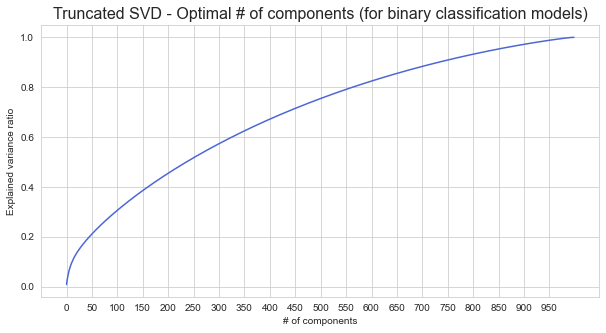

In [270]:
# First run CountVectorizer on the X train/test ('posts' column) - using I-E axis as reference
tf_idf = TfidfVectorizer(stop_words=stop_update, ngram_range=(1,2), max_features=1000)
tf_idf.fit(X_train_IE)
X_train_IE_tf_idf = tf_idf.transform(X_train_IE)

# Use max components and graph the explained variance ratio to find cutoff point 
tsvd = TruncatedSVD(n_components=999)
tsvd.fit(X_train_IE_tf_idf)
plt.figure(figsize=[10,5])
plt.plot(range(999), tsvd.explained_variance_ratio_.cumsum())
plt.title("Truncated SVD - Optimal # of components (for binary classification models)", fontsize=16)
plt.xlabel("# of components")
plt.xticks([i for i in range(0,999,50)])
plt.ylabel("Explained variance ratio");

In [271]:
# Create pipeline for the data preprocessing steps (CountVectorizer, TruncatedSVD) on the X data
pipeline_preprocessing2 = make_pipeline(
    TfidfVectorizer(stop_words=stop_update, ngram_range=(1,2), max_features=1000),
    TruncatedSVD(n_components=100))

In [ ]:
from sklearn.pipeline import make_pipeline

In [272]:
# Preprocess each of the train-test splits
# Introversion - Extroversion
X_train_IE_tsvd = pipeline_preprocessing2.fit_transform(X_train_IE)
X_test_IE_tsvd = pipeline_preprocessing2.transform(X_test_IE)

# Intuition - Sensing
X_train_NS_tsvd = pipeline_preprocessing2.fit_transform(X_train_NS)
X_test_NS_tsvd = pipeline_preprocessing2.transform(X_test_NS)

# Thinking - Feeling
X_train_TF_tsvd = pipeline_preprocessing2.fit_transform(X_train_TF)
X_test_TF_tsvd = pipeline_preprocessing2.transform(X_test_TF)

# Judging - Perceiving
X_train_JP_tsvd = pipeline_preprocessing2.fit_transform(X_train_JP)
X_test_JP_tsvd = pipeline_preprocessing2.transform(X_test_JP)

# Resampling all the 4 axes

In [273]:
# Use SMOTE (Synthetic Minority Over-sampling Technique) to even out the unbalanced test sample
sm=SMOTE()
Xsm_train_IE_tsvd, ysm_train_IE = sm.fit_resample(X_train_IE_tsvd, y_train_IE)
Xsm_train_NS_tsvd, ysm_train_NS = sm.fit_resample(X_train_NS_tsvd, y_train_NS)
Xsm_train_TF_tsvd, ysm_train_TF = sm.fit_resample(X_train_TF_tsvd, y_train_TF)
Xsm_train_JP_tsvd, ysm_train_JP = sm.fit_resample(X_train_JP_tsvd, y_train_JP)

In [274]:
#train a separate classifier for each axis, enable loss='log' and class_weight='balanced'
sgdc1 = SGDClassifier(l1_ratio=0.15,loss='hinge',max_iter=200,n_jobs=-1,penalty='l1')
sgdc2 = SGDClassifier(l1_ratio=0.15,loss='hinge',max_iter=200,n_jobs=-1,penalty='l1')
sgdc3 = SGDClassifier(l1_ratio=0.15,loss='hinge',max_iter=200,n_jobs=-1,penalty='l1')
sgdc4 = SGDClassifier(l1_ratio=0.15,loss='hinge',max_iter=200,n_jobs=-1,penalty='l1')

# Fitting SGDClassifier to each axis

In [275]:
IE = sgdc1.fit(X_train_IE_tsvd, y_train_IE)
NS = sgdc2.fit(X_train_NS_tsvd, y_train_NS)
TF = sgdc3.fit(X_train_TF_tsvd, y_train_TF)
JP = sgdc4.fit(X_train_JP_tsvd, y_train_JP)

# Accuracy of non reference dataset

In [276]:
IE_score = sgdc1.score(X_test_IE_tsvd, y_test_IE)
NS_score = sgdc2.score(X_test_NS_tsvd, y_test_NS)
TS_score = sgdc3.score(X_test_TF_tsvd, y_test_TF)
JP_score = sgdc4.score(X_test_JP_tsvd, y_test_JP)

print('IE score: {}'.format(IE_score) + '\n'
     + 'NS score: {}'.format(NS_score) + '\n'
     + 'TF score: {}'.format(TS_score) + '\n'
     + 'JP score: {}'.format(JP_score))

IE score: 0.7802535535920092
NS score: 0.8551671148674607
TF score: 0.755666538609297
JP score: 0.6523242412600845


From this we can tell taht each of the 16 class references when present in the data are the most discriminative features of the personality classes.

# Twitter Posts Personality Prediction

### Using a few tweets and blog posts we will predict the personality.

In [360]:
tweet_posts = """Getting started with data science and applying machine learning has never been as simple as it is now. There are many free and paid online tutorials and courses out there to help you to get started. I’ve recently started to learn, play, and work on Data Science & Machine Learning on Kaggle.com. In this brief post, I’d like to share my experience with the Kaggle Python Docker image, which simplifies the Data Scientist’s life.
Awesome #AWS monitoring introduction.
HPE Software (now @MicroFocusSW) won the platinum reader's choice #ITAWARDS 2017 in the new category #CloudMonitoring
Certified as AWS Certified Solutions Architect 
Hi, please have a look at my Udacity interview about online learning and machine learning,
Very interesting to see the  lessons learnt during the HP Operations Orchestration to CloudSlang journey. http://bit.ly/1Xo41ci 
I came across a post on devopsdigest.com and need your input: “70% DevOps organizations Unhappy with DevOps Monitoring Tools”
In a similar investigation I found out that many DevOps organizations use several monitoring tools in parallel. Senu, Nagios, LogStach and SaaS offerings such as DataDog or SignalFX to name a few. However, one element is missing: Consolidation of alerts and status in a single pane of glass, which enables fast remediation of application and infrastructure uptime and performance issues.
Sure, there are commercial tools on the market for exactly this use case but these tools are not necessarily optimized for DevOps.
So, here my question to you: In your DevOps project, have you encountered that the lack of consolidation of alerts and status is a real issue? If yes, how did you approach the problem? Or is an ChatOps approach just right?
You will probably hear more and more about ChatOps - at conferences, DevOps meet-ups or simply from your co-worker at the coffee station. ChatOps is a term and concept coined by GitHub. It's about the conversation-driven development, automation, and operations.
Now the question is: why and how would I, as an ops-focused engineer, implement and use ChatOps in my organization? The next question then is: How to include my tools into the chat conversation?
Let’s begin by having a look at a use case. The Closed Looped Incidents Process (CLIP) can be rejuvenated with ChatOps. The work from the incident detection runs through monitoring until the resolution of issues in your application or infrastructure can be accelerated with improved, cross-team communication and collaboration.
In this blog post, I am going to describe and share my experience with deploying HP Operations Manager i 10.0 (OMi) on HP Helion Public Cloud. An Infrastructure as a Service platform such as HP Helion Public Cloud Compute is a great place to quickly spin-up a Linux server and install HP Operations Manager i for various use scenarios. An example of a good use case is monitoring workloads across public clouds such as AWS and Azure."""

In [361]:
clean_tweet_posts=clean_text(tweet_posts)

In [362]:
clean_tweet_posts

'getting started data science applying machine learning never simple many free paid online tutorial course help get started ’ recently started learn play work data science machine learning kagglecom brief post ’ like share experience kaggle python docker image simplifies data scientist ’ life awesome aws monitoring introduction hpe software microfocussw platinum reader choice itawards new category cloudmonitoring certified aws certified solution architect hi please look udacity interview online learning machine learning interesting see lesson learnt hp operation orchestration cloudslang journey came across post devopsdigestcom need input “ devops organization unhappy devops monitoring tool ” similar investigation found many devops organization use several monitoring tool parallel senu nagios logstach saas offering datadog signalfx name however element missing consolidation alert status single pane glass enables fast remediation application infrastructure uptime performance issue sure c

In [363]:
tfidf = TfidfVectorizer(stop_words=stop_update, ngram_range=(1,2), max_features=50)

In [364]:
tfmyposts = tfidf.fit_transform([clean_tweet_posts])

In [365]:
tfmyposts

<1x50 sparse matrix of type '<class 'numpy.float64'>'
	with 50 stored elements in Compressed Sparse Row format>

In [366]:
#mypoststf = tsvd.transform(tfmyposts)

In [367]:
tfmyposts.shape

(1, 50)

In [368]:
y_pred = sgdc.predict(tfmyposts)

In [376]:
print(f'The predicted mbti personalty type is {y_pred[0]}')

The predicted mbti personalty type is ENFP
